# Initialization

In [2]:
folder.path = "C:/Users/paslanpatir/Desktop/TEZ_v2/"
source(paste0(folder.path,"pickleware/pickleware/Results_Combined_SourceCode.r"))

*list.files(outputs.path, pattern=NULL, all.files=FALSE, full.names=FALSE)*

Files include:
* outputs.path.1.refr : 11 seed x 10 rep
             oneshot,Rd,  Ad_range,Ad_sd,  Ad_coefvar: mtry in (2,6)                        
                 * test = 100
                 * nperm = 5
                 * bagging
                 * importance : ?
                 
* outputs.path.2.refr : 11 seed x 10 rep
             oneshot: mtry in (2,3,4,6) 
             Rd: mtry = 2 , (seed != 9)
             Ad_range: mtry in (2,4)  
             Ad_sd: mtry in (2,3,4,6)
             Ad_coefvar: mtry in (2,6)
             Ad_coefvar_FeatSel_Begin,  Ad_coefvar_FeatSel_End: mtry = 2                        
             * test in (100,200,300,400)
             * nperm = 5 
             * importance : all types
                      
* outputs.path.1.wrep : 10 seed x 10 rep
             oneshot,  Rd,  Ad_range,  Ad_sd,  Ad_coefvar
             * test = 100
             * nperm = 1
             * bagging
             * importance : scaled permutation
* outputs.path.2.wrep : 
            oneshot,  Rd,  Ad_range,  Ad_sd,  Ad_coefvar (all in mtry = 2)
             * test = 100
             * nperm = 1
             * importance : scaled permutation

list of data:
* unlabeled.1
* unlabeled.2
* test_set_all.1
* test_set_all.2
* training_set_all.1 
* training_set_all.2 
* training_set_all_small.1
* training_set_all_small.2

list of outputs:

* performance : perf_all
* oob_error : oob_all
* train candidates: candidate.all.1 & candidate.all.2
* importance : importance.wrep.all & importance.refr.all


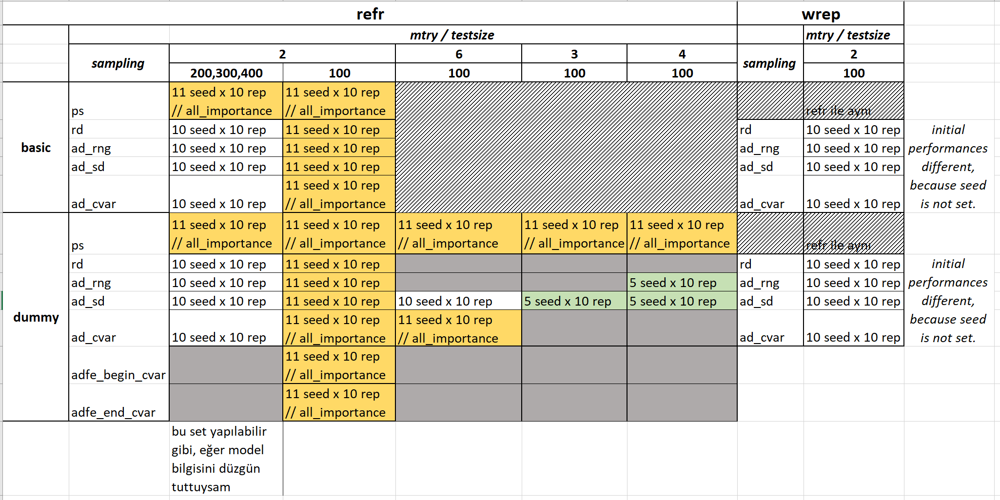

# Data Distributions

## Test Sets 

test_set_all.1
test_set_all.2

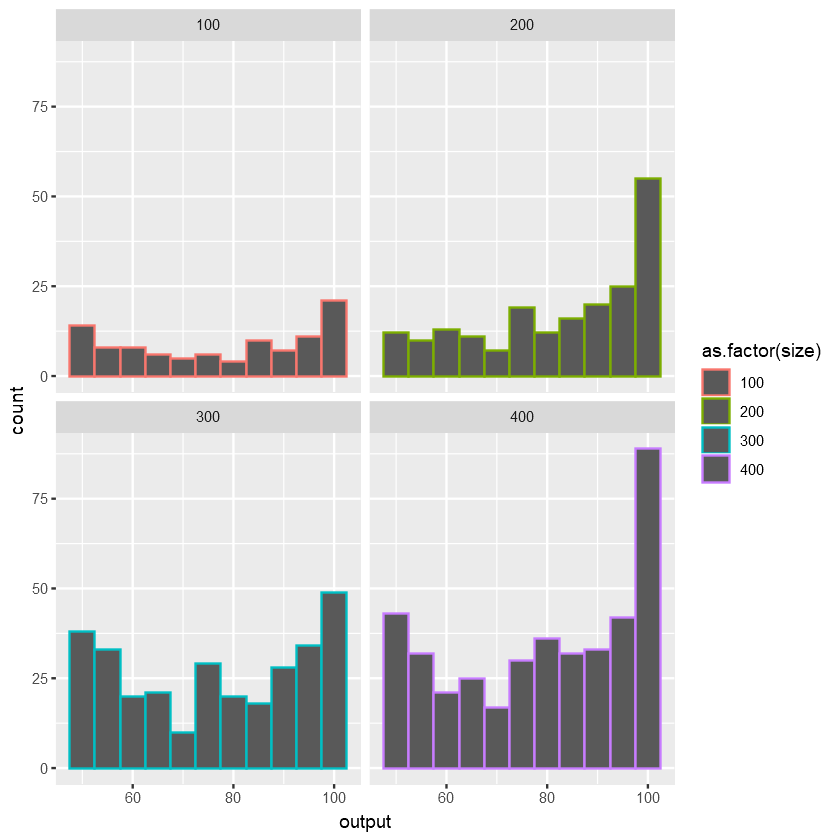

In [100]:
ggplot(data = test_set_all.1, aes(x = output, col = as.factor(size))  ) + 
            geom_histogram(binwidth = 5) +
            facet_wrap(~size)

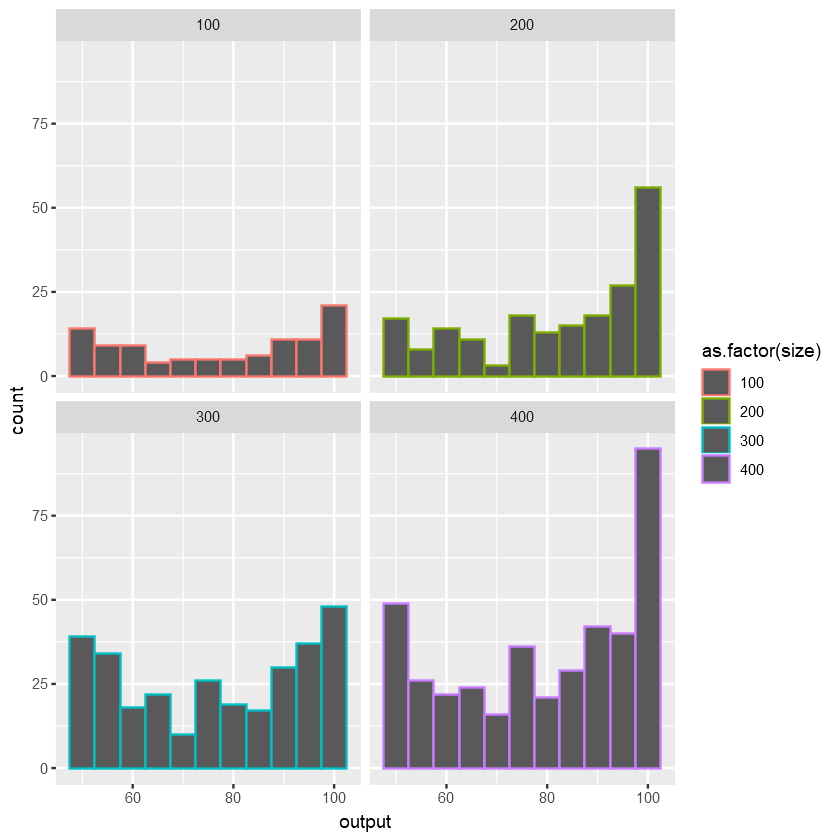

In [102]:
ggplot(data = test_set_all.2, aes(x = output, col = as.factor(size))  ) + 
            geom_histogram(binwidth = 5) +
            facet_wrap(~size)

## Initial Training Sets

### Small Set

#### Segregation Model with Noise

In [3]:
head(training_set_all.2)

density,%-similar-wanted,budget-multiplier-dummy,density-multiplier-dummy,noise-dummy,tick-limit,output,seed
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
67.26549,38.75583,6.596594,0.3448759,4.315213e-05,98.38226,81.36020,0
35.32743,57.56989,7.168910,0.3034376,7.021631e-05,97.11745,98.12388,0
64.49305,49.54214,6.926801,0.3577082,4.194005e-05,101.75620,89.04723,0
51.99029,67.05365,4.806772,0.5838802,4.660152e-05,103.40506,99.82004,0
55.06070,42.05620,6.992751,0.5944945,6.281491e-05,100.45567,88.31836,0
28.86366,53.21122,4.623894,0.6272731,4.499993e-05,98.66228,98.82168,0


In [4]:
training_set.2 <- highlight_key(training_set_all_small.2, ~ seed )
training_plot.2 = ggplot(data = training_set.2, aes(x = density, y = `%-similar-wanted`, col = as.factor(seed) , group = as.factor(seed))  ) + 
                        theme_bw() +
                        geom_point(size = 1)
gg <- ggplotly( training_plot.2, tooltip = "seed" )
highlight( gg, on = "plotly_hover", off = "plotly_deselect", color = "red" )

HTML widgets cannot be represented in plain text (need html)

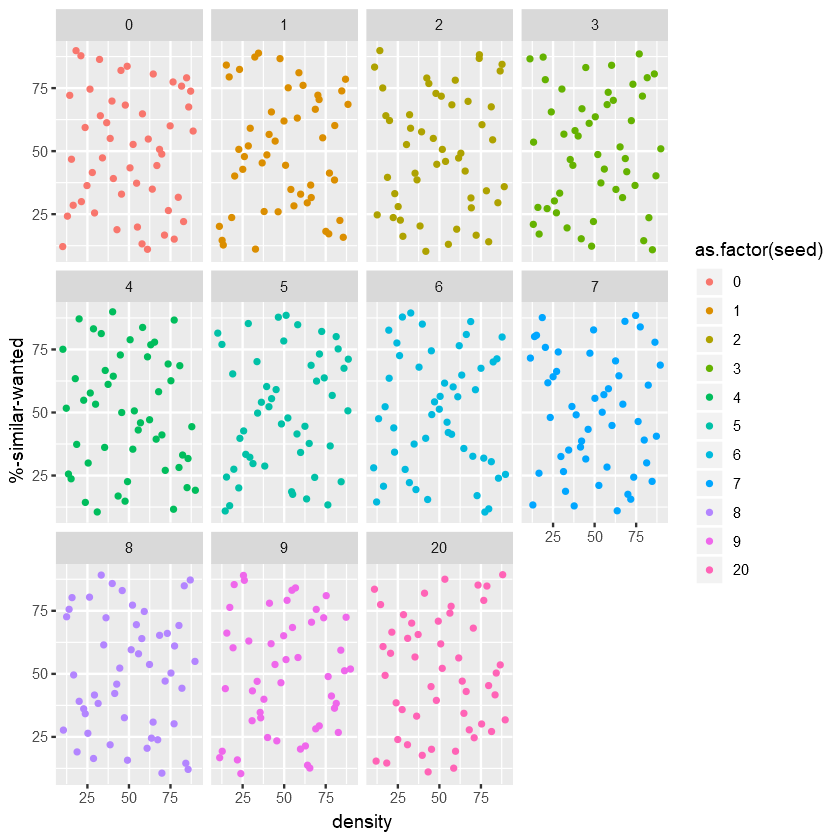

In [5]:
ggplot(data = training_set_all_small.2, aes(x = density, y = `%-similar-wanted`, col = as.factor(seed) , group = as.factor(seed))  ) + 
            geom_point(size = 1) +
            facet_wrap(~seed)

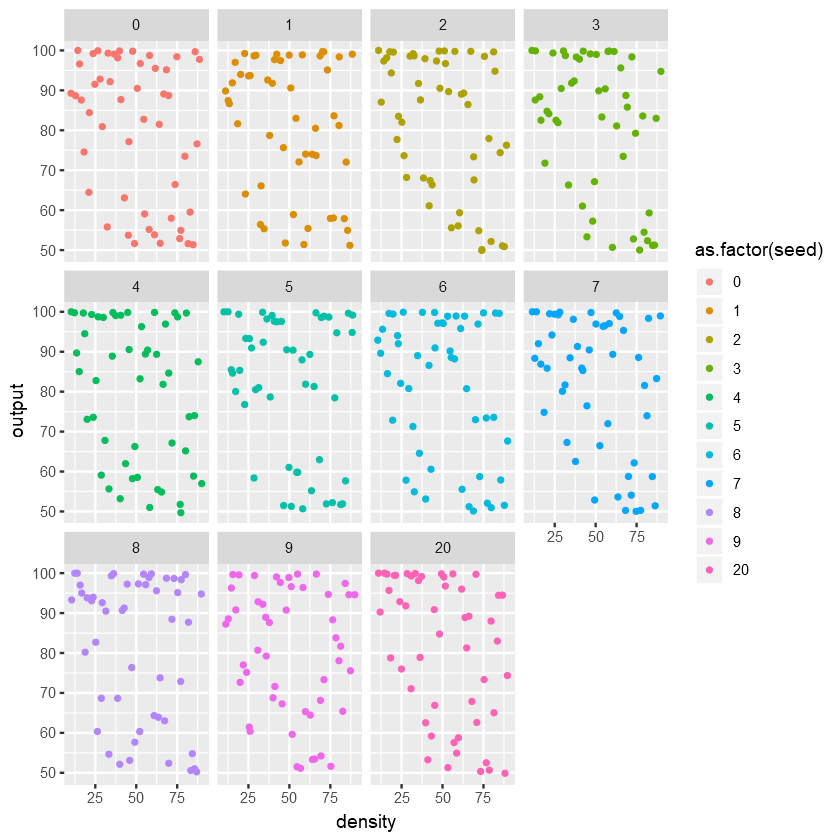

In [6]:
ggplot(data = training_set_all_small.2, aes(x = density, y = output, col = as.factor(seed) , group = as.factor(seed))  ) + 
            geom_point(size = 1) +
            facet_wrap(~seed)

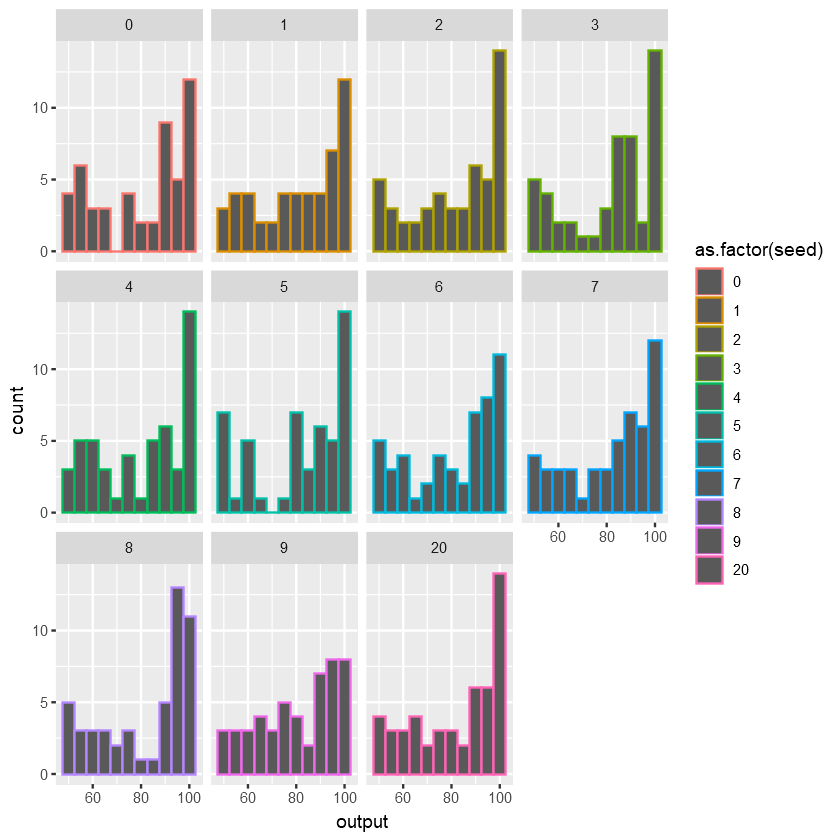

In [7]:
ggplot(data = training_set.2, aes(x = output, col = as.factor(seed))  ) + 
            geom_histogram(binwidth = 5) +
            facet_wrap(~seed)

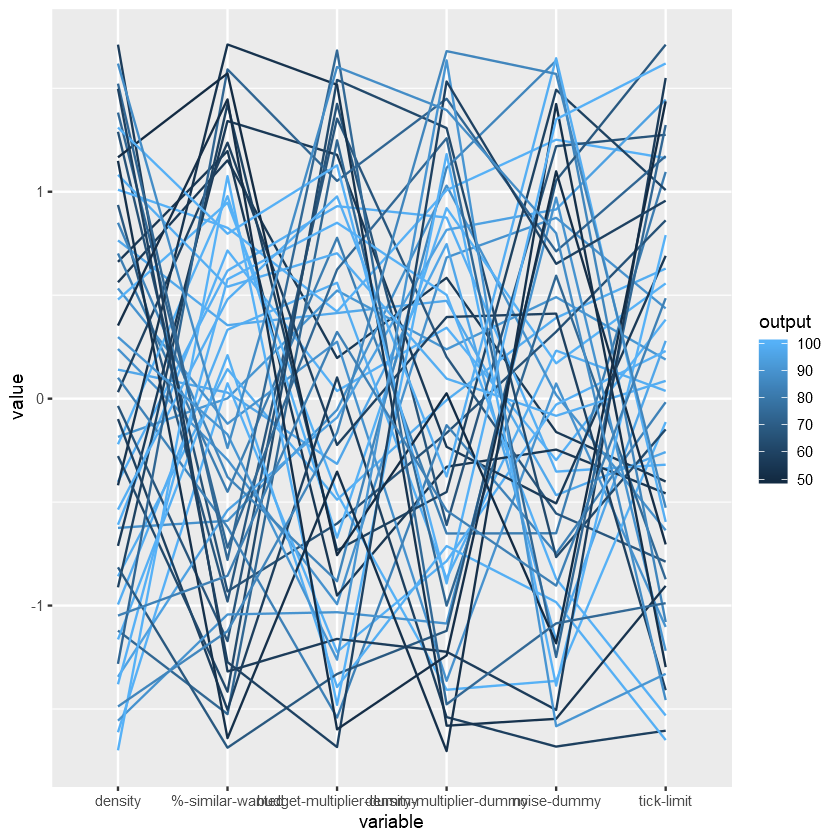

In [8]:
ggparcoord(training_set_all_small.2[seed == 4],
    columns = 1:6, groupColumn = 7
    ) 

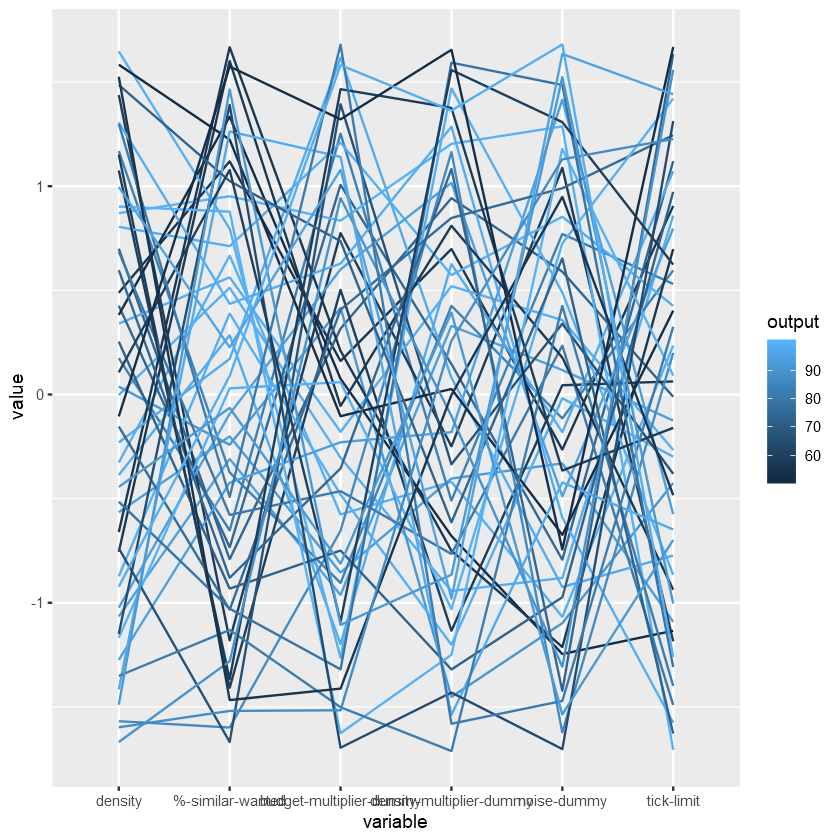

In [9]:
ggparcoord(training_set_all_small.2[seed == 1],
    columns = 1:6, groupColumn = 7
    ) 

# Performance Comparisons

In [10]:
head(perf_all)
perf_all$sampling <- factor(perf_all$sampling, levels = c('ps','rd','ad_rng','ad_sd','ad_cvar','adfe_begin_cvar','adfe_end_cvar'), ordered = T)

iter,seed,rep,mae,rmse,mape,model,pool,sampling,testsize,mtry
<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>
1,0,1,2.698160,5.016994,4.019452,basic,wrep,ps,100,2
1,0,2,2.668782,4.909340,3.973260,basic,wrep,ps,100,2
1,0,3,2.705488,5.011937,4.030132,basic,wrep,ps,100,2
1,0,4,2.780665,5.118991,4.167613,basic,wrep,ps,100,2
1,0,5,2.754322,5.152491,4.117096,basic,wrep,ps,100,2
1,0,6,2.753141,5.038536,4.125870,basic,wrep,ps,100,2


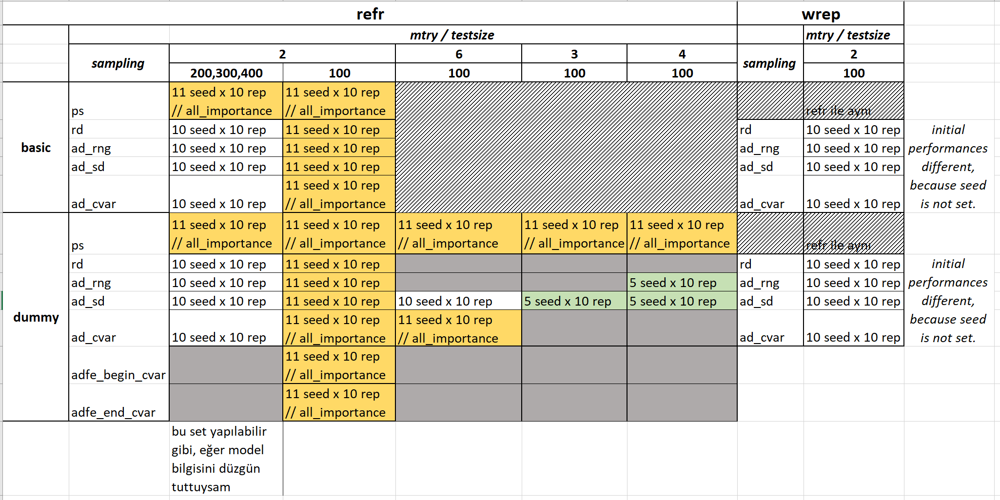

**Wrep'lerde, seed set edilmediği için, aynı initial data sette eğitilen Ad_range ve Ad_sd, mesela, farklı performanslar gösterebiliyor. Ama bu performanslar çok farklı mı birbirinden? Eğer çok farklı değilse, deney karşılaştırmalarında kullanılabilir hala**

In [11]:
active_initial_perf = perf_all[iter == 1 & mtry == 2 & testsize == 100 & sampling %in% c("rd","ad_rng","ad_sd","ad_cvar")
                             , .(sd_perf = sd(rmse)),.(seed,rep,model,pool)]

unique(active_initial_perf[sd_perf != 0]$pool)
# so, in wrep' initial performances of sampling might be different

[1] "wrep"

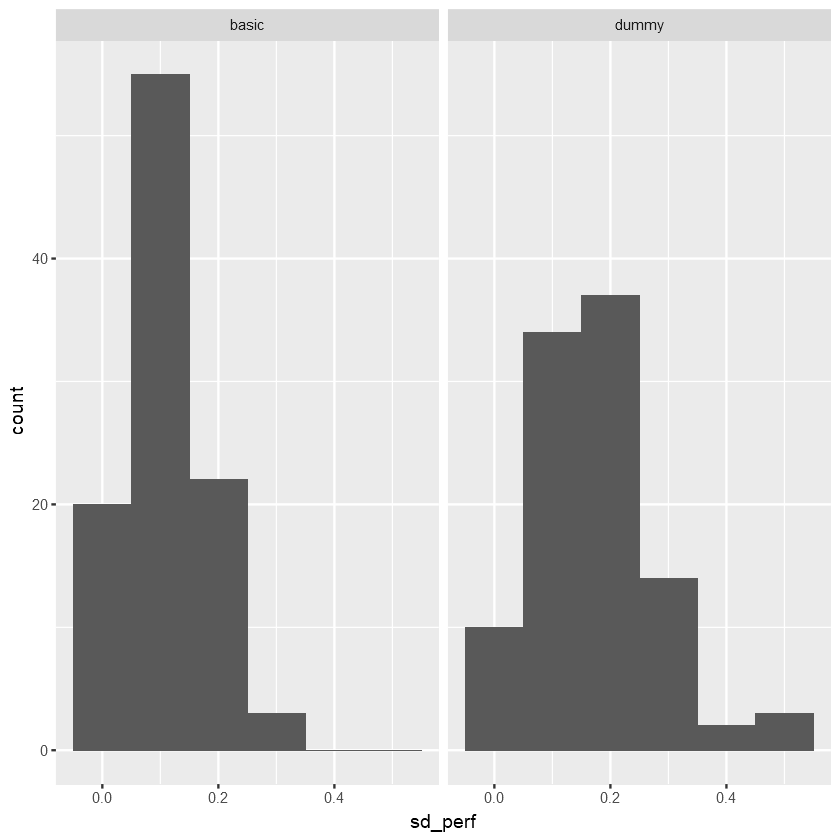

In [16]:
ggplot(active_initial_perf[sd_perf != 0], aes(x = sd_perf)) + geom_histogram(binwidth = 0.1) + facet_wrap(~model)

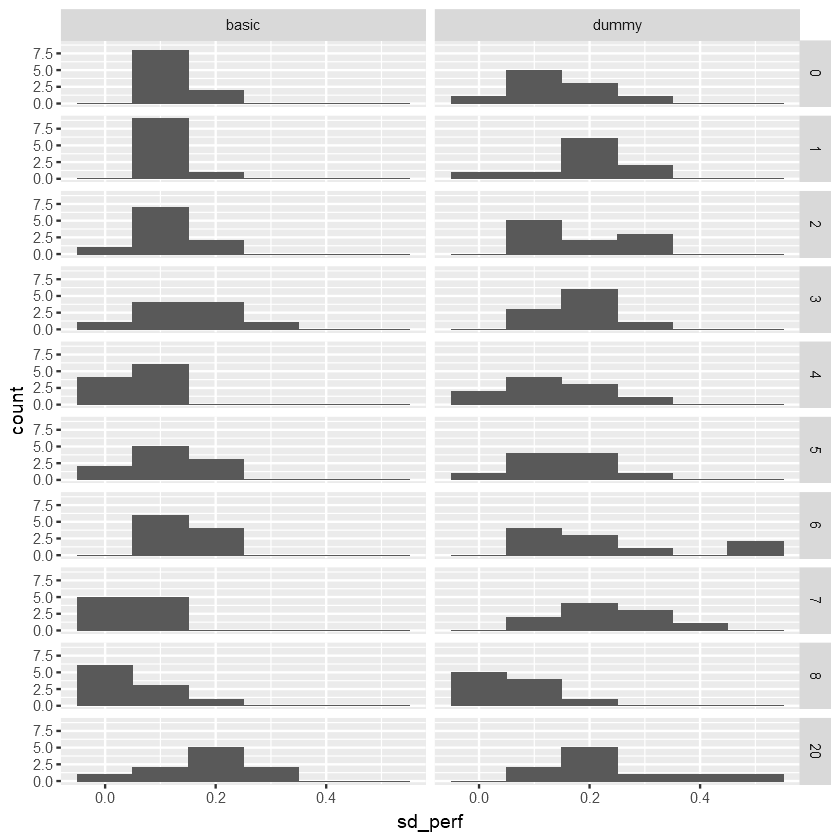

In [13]:
ggplot(active_initial_perf[sd_perf != 0], aes(x = sd_perf)) + geom_histogram(binwidth = 0.1) + facet_grid(seed~model)

In [14]:
perf_all[iter == 1 & seed == 6 & rep == 2 & model == "dummy" & mtry == 2 & testsize == 100 & pool == "wrep" & sampling %in% c("rd","ad_rng","ad_sd","ad_cvar")]


iter,seed,rep,mae,rmse,mape,model,pool,sampling,testsize,mtry
<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<ord>,<dbl>,<dbl>
1,6,2,10.35571,12.18196,15.50081,dummy,wrep,rd,100,2
1,6,2,11.00746,12.74879,16.30743,dummy,wrep,ad_rng,100,2
1,6,2,11.00746,12.74879,16.30743,dummy,wrep,ad_sd,100,2
1,6,2,10.00749,11.68881,14.83754,dummy,wrep,ad_cvar,100,2


## The Effect of Sampling on Performance (refr)

In [ ]:
perf_all[is.na(sampling)]

In [17]:
refr_basic= perf_all[pool == "refr" & model == "basic" & testsize == 100 & mtry == 2]
# can be different testsize and seeds ( if you campare test sizes then specfy seeds)
refr_dummy= perf_all[pool == "refr" & model == "dummy" & testsize == 100 & mtry == 2]
# can be different testsize , mtry, and seeds ( if you campare test sizes then specfy seeds)

### Segregation Model 

**General performance**

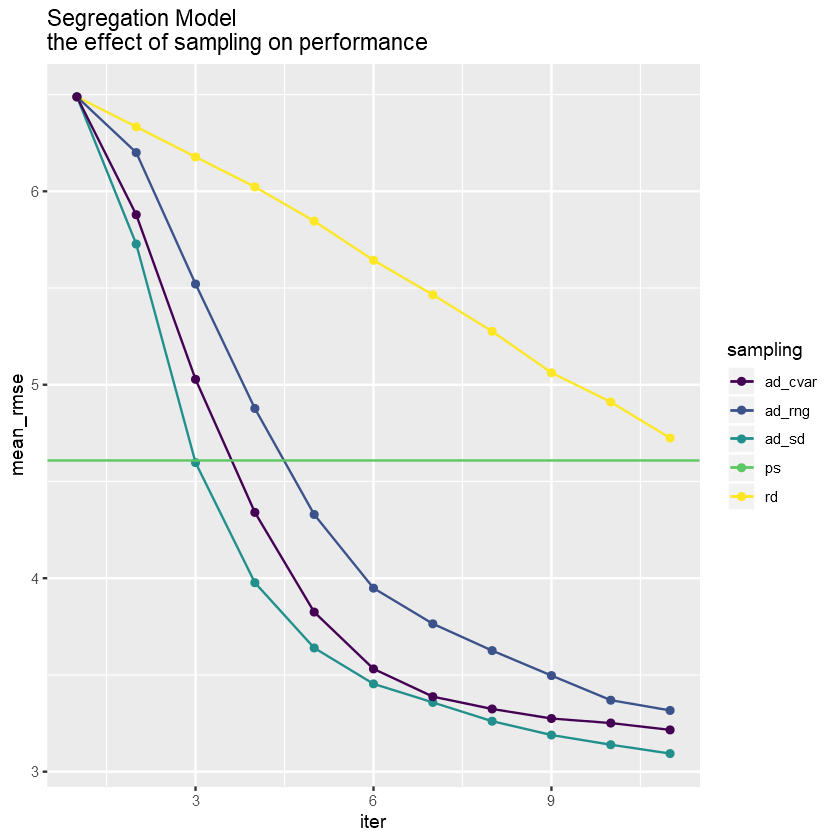

In [18]:
ggplot(data = refr_basic[sampling != "ps", .(mean_rmse = mean(rmse)), .(iter, sampling)], 
          aes(x = iter, y = mean_rmse, col = sampling, group = sampling)) + 
    geom_line() + 
    geom_point() + 
    geom_hline(data = refr_basic[sampling == "ps", .(mean_rmse = mean(rmse)),.(iter, sampling)],
                aes(yintercept = mean_rmse, col = sampling)) + 
    ggtitle(paste0("Segregation Model", "\n", "the effect of sampling on performance "))

**Effect of seeds on general performance**

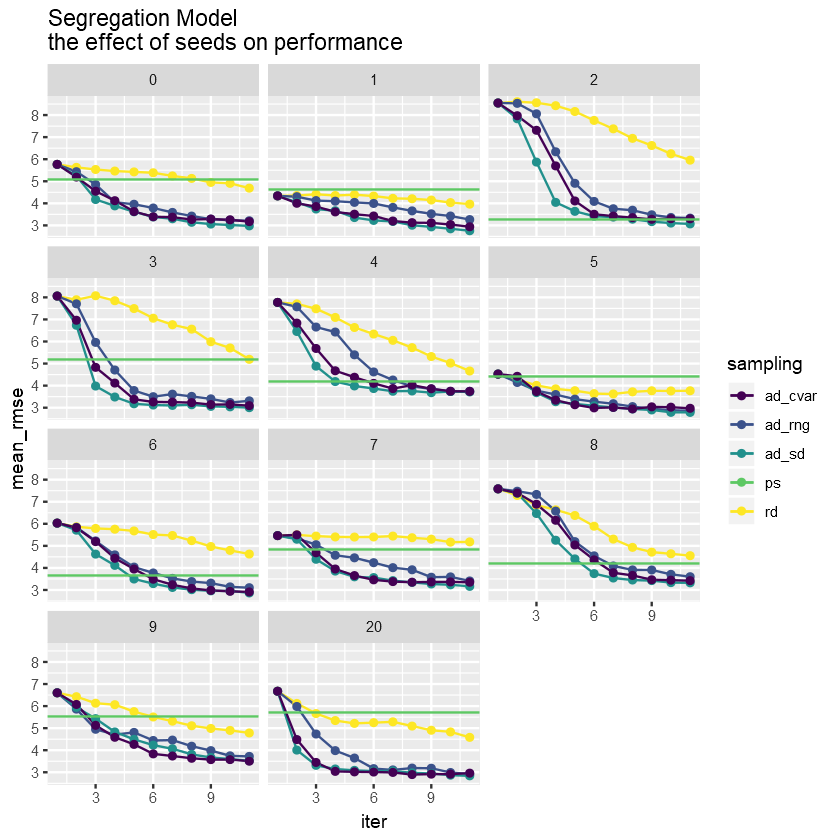

In [19]:
ggplot(data = refr_basic[sampling != "ps", .(mean_rmse = mean(rmse)),.(iter,sampling,seed)]
       , aes(x = iter, y = mean_rmse, col = sampling, group = sampling)) + 
    geom_line() + 
    geom_point() +
    geom_hline(data = refr_basic[testsize == 100 & sampling == "ps", .(mean_rmse = mean(rmse)),.(iter,sampling,seed)],
                  aes(yintercept = mean_rmse, col = sampling)) +
    facet_wrap(~seed, ncol = 3) +
    ggtitle(paste0("Segregation Model", "\n", "the effect of seeds on performance "))

**Marginal Effect of Seeds on the general performance**

In [21]:
refr_basic_margin = data.table()
all.seed = c(0:9,20)
for(i in all.seed){
seed.focus = setdiff(all.seed,i)     
   refr_basic_margin =  rbind(refr_basic_margin
                            , data.table(
                      refr_basic[seed %in% seed.focus, .(mean_rmse = mean(rmse)),.(iter,sampling)] %>% 
                         dcast(iter~sampling, value.var = "mean_rmse") %>% setcolorder(c("iter","ps","rd","ad_rng","ad_sd","ad_cvar")),
                      seed_without = i)
          )
}
refr_basic_margin[, ps := na.locf(ps, na.rm = TRUE)]
refr_basic_margin = melt(refr_basic_margin, id.vars = c("seed_without","iter"), measure.vars = c("ps","rd","ad_rng","ad_sd","ad_cvar"))
setnames(refr_basic_margin, c("variable","value"),c("sampling","mean_rmse"))
refr_basic_margin$sampling <- factor(refr_basic_margin$sampling, levels = c('ps','rd','ad_rng','ad_sd','ad_cvar'), ordered = T)

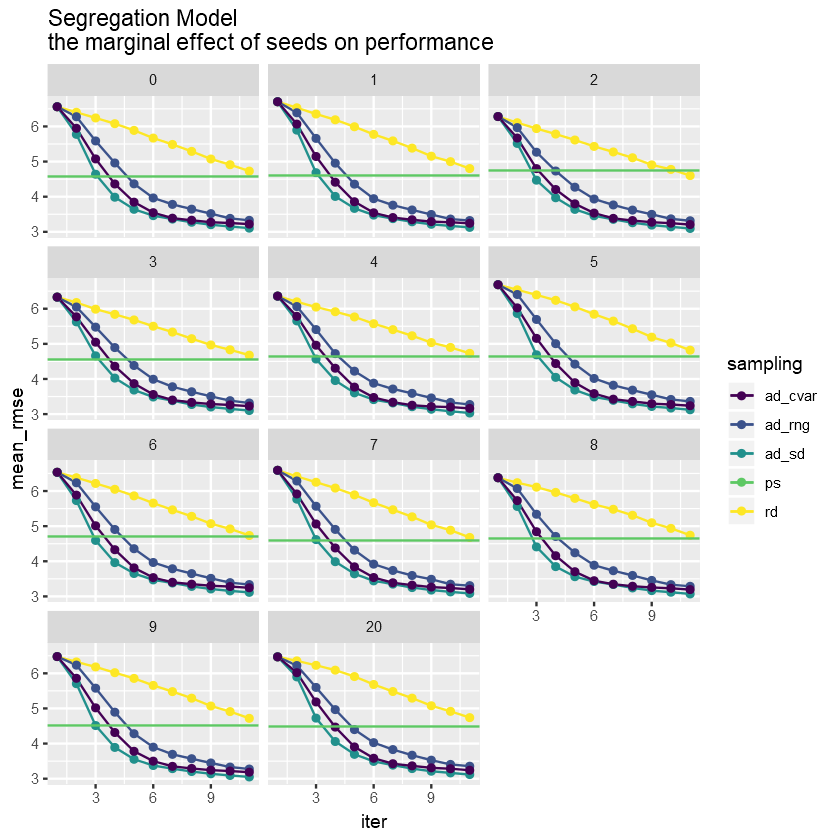

In [22]:
ggplot(data = refr_basic_margin[ sampling != "ps"]
       , aes(x = iter, y = mean_rmse, col = sampling, group = sampling)) + geom_line() + geom_point() +
        geom_hline(data = refr_basic_margin[sampling == "ps"],
                  aes(yintercept = mean_rmse, col = sampling)) +
    facet_wrap(~seed_without, ncol = 3)+ 
    ggtitle(paste0("Segregation Model", "\n", "the marginal effect of seeds on performance "))

herhangi bir seed'i dahil etmeden hesaplama yaptığımızda Ad yöntemleri için sonuç büyük ölçüde değişmiyor. Ama Rd, pasif'e göre daha iyi ya da daha kötü perform edebiliyor. Ad'lerin stabilitesi daha yüksek.

**When ps is outperformed**

*when the samplings outperferm the passive sampling*

In [26]:
refr_basic_Samplings =  refr_basic[, .(mean_rmse = mean(rmse)),.(iter,sampling,seed)] %>% 
                         dcast(seed + iter~sampling, value.var = "mean_rmse") %>% 
                        setcolorder(c("seed","iter","ps","rd","ad_rng","ad_sd","ad_cvar"))
refr_basic_Samplings[, ps := na.locf(ps, na.rm = TRUE)]
refr_basic_Samplings[,':='(rd_pass=ifelse(rd>ps, NA,iter), 
                           ad_rng_pass=ifelse(ad_rng>ps, NA,iter),
                           ad_sd_pass=ifelse(ad_sd>ps, NA,iter),
                           ad_cvar_pass=ifelse(ad_cvar>ps, NA,iter))]
refr_basic_Samplings[,':='(rd_pass = na.locf(rd_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_rng_pass = na.locf(ad_rng_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_sd_pass = na.locf(ad_sd_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_cvar_pass = na.locf(ad_cvar_pass, na.rm = FALSE,fromLast = TRUE)) ,.(seed)]

refr_basic_Samplings[is.na(refr_basic_Samplings)] <- 100 # replace NA

In [27]:
refr_basic_Samplings[iter == 1,.(seed,passive = ps,active = rd,diff_active_pas = round(rd - ps,2),rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass)]

print(paste0("standard deviation of initial passive peformance:", 
    sd(refr_basic_Samplings[iter == 1,.(seed,passive = ps,active = rd,rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass)]$passive) %>% round(2)))
print(paste0("standard deviation of initial active peformance:", 
    sd(refr_basic_Samplings[iter == 1,.(seed,passive = ps,active = rd,rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass)]$active) %>% round(2)))

seed,passive,active,diff_active_pas,rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
0,5.062871,5.766124,0.70,9,3,3,3
1,4.638336,4.338681,-0.30,1,1,1,1
2,3.282220,8.548465,5.27,100,100,9,9
3,5.162967,8.061787,2.90,100,4,3,3
4,4.170111,7.772603,3.60,100,8,5,6
5,4.414326,4.525230,0.11,2,2,2,3
6,3.660131,6.031863,2.37,100,7,5,6
7,4.834201,5.465284,0.63,100,4,3,3
8,4.214874,7.584466,3.37,100,7,6,7


[1] "standard deviation of initial passive peformance:0.76"
[1] "standard deviation of initial active peformance:1.41"


In [28]:
median(refr_basic_Samplings[iter == 1 & seed != 1]$rd_pass)
median(refr_basic_Samplings[iter == 1 & seed != 1]$ad_rng_pass)
median(refr_basic_Samplings[iter == 1 & seed != 1]$ad_sd_pass)
median(refr_basic_Samplings[iter == 1 & seed != 1]$ad_cvar_pass)

[1] 100

[1] 4

[1] 3

[1] 3

**Basic Refr TestSet = 100 için genel sonuçlar**
* **Dikkat!** : seed = 1'de active için olan küçük set daha iyi performans sağlıyor. Bu unexpected. --> bu yüzden seed1'siz analiz yapmak anlamlı olabilir, outlier sonuçta.
* **Dikkat!** : seed = 2'de active ile passive datalarının sağladığı performanslar arasında uçurum var. Bu da unexpected. Ama u halde bile, geç de olsa, ad_sd daha iyi performans gösteriyor.
* seed2 dışında da ad'ler en geç 8. iterasyonda, passive'ı beat ediyor.
* initial performance'lar arasında ciddi bir fark olmadığında ( diff <= 1.05 ),   Ad yöntemleri en geç 4. adımda passive'ı outperferm ediyor.
* Ad yöntemlerinin median'ları en fazla 4 ( Seed 1 elendiğinde, çünkü bias katıyor). Yani uygulamaların en az yarısında, 70 instance'lı dataset, 100'den daha iyi perform ediyor Ad yöntemi uygulanırsa.
* Öte yandan Rd sampling ile uygulamaların en az yarısında, passive set'in performansı geçilemiyor.

In [29]:
# eğer replikasyonları da hesaba katarsak;
refr_basic_Samplings_rep =  refr_basic[testsize == 100 ,.(iter,seed,rep,sampling,rmse)] %>% 
                         dcast(seed + rep + iter~sampling, value.var = "rmse") %>% 
                        setcolorder(c("seed","rep","iter","ps","rd","ad_rng","ad_sd","ad_cvar"))

refr_basic_Samplings_rep[, ps := na.locf(ps, na.rm = TRUE)]
refr_basic_Samplings_rep[,':='(rd_pass=ifelse(rd>ps, NA,iter), 
                           ad_rng_pass=ifelse(ad_rng>ps, NA,iter),
                           ad_sd_pass=ifelse(ad_sd>ps, NA,iter),
                           ad_cvar_pass=ifelse(ad_cvar>ps, NA,iter))]
refr_basic_Samplings_rep[,':='(rd_pass = na.locf(rd_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_rng_pass = na.locf(ad_rng_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_sd_pass = na.locf(ad_sd_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_cvar_pass = na.locf(ad_cvar_pass, na.rm = FALSE,fromLast = TRUE)) ,.(seed,rep)]

refr_basic_Samplings_rep[is.na(refr_basic_Samplings_rep)] <- 100 # replace NA

In [30]:
median(refr_basic_Samplings_rep[iter == 1 & seed != 1]$rd_pass)
median(refr_basic_Samplings_rep[iter == 1 & seed != 1]$ad_rng_pass)
median(refr_basic_Samplings_rep[iter == 1 & seed != 1]$ad_sd_pass)
median(refr_basic_Samplings_rep[iter == 1 & seed != 1]$ad_cvar_pass)

[1] 11

[1] 4

[1] 3

[1] 3

**How much ps is outperformed**

In [31]:
# how much the samplings outperform the passive sampling
refr_basic_Samplings_temp = refr_basic_Samplings[iter %in% c(1,11),.(seed,iter,ps,rd,ad_rng,ad_sd,ad_cvar)] %>% 
                                   melt(id.vars = c("seed","iter","ps"), measure.vars = c("rd","ad_rng","ad_sd","ad_cvar")) %>%
                                   dcast(seed + variable + ps ~iter,value.var = "value")
setnames(refr_basic_Samplings_temp,c("variable","1","11"),c("sampling","initial","final"))
refr_basic_Samplings_temp[,':=' (diff_ps_initial = round(initial-ps,2),
                                 diff_initial_final = round(initial-final,2),
                                 performance_gain = ((ps-final)/ps)*100,
                                 outperform_ps = ifelse(final < ps,"1","0"))
                         ]

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


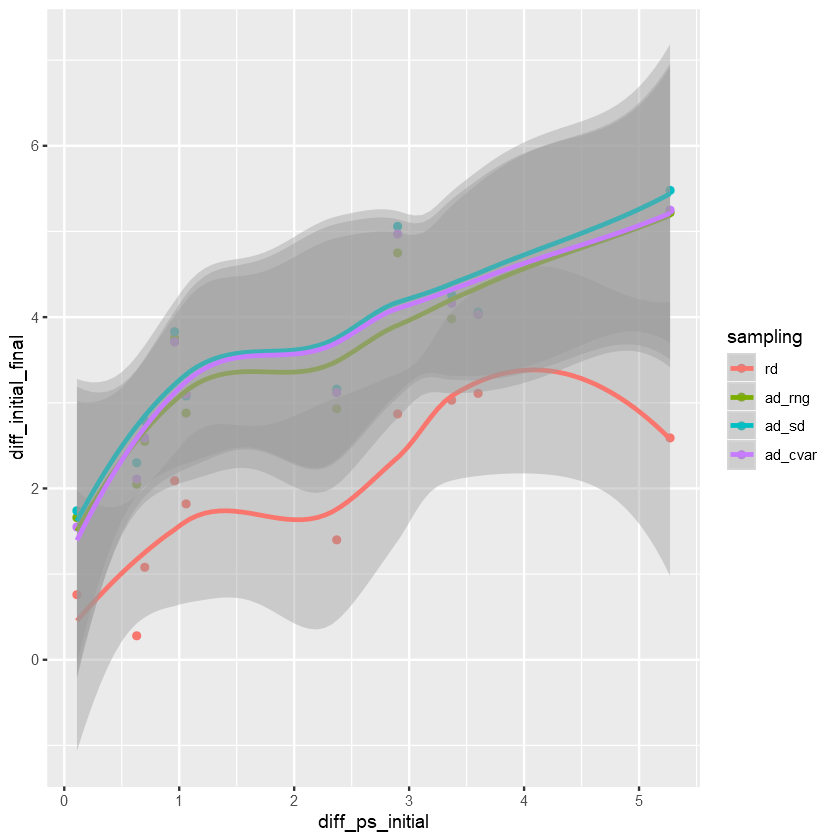

In [32]:
ggplot(data = refr_basic_Samplings_temp[seed != 1], aes(x = diff_ps_initial, y = diff_initial_final, col = sampling, group = sampling)) +
        geom_point() + geom_smooth()

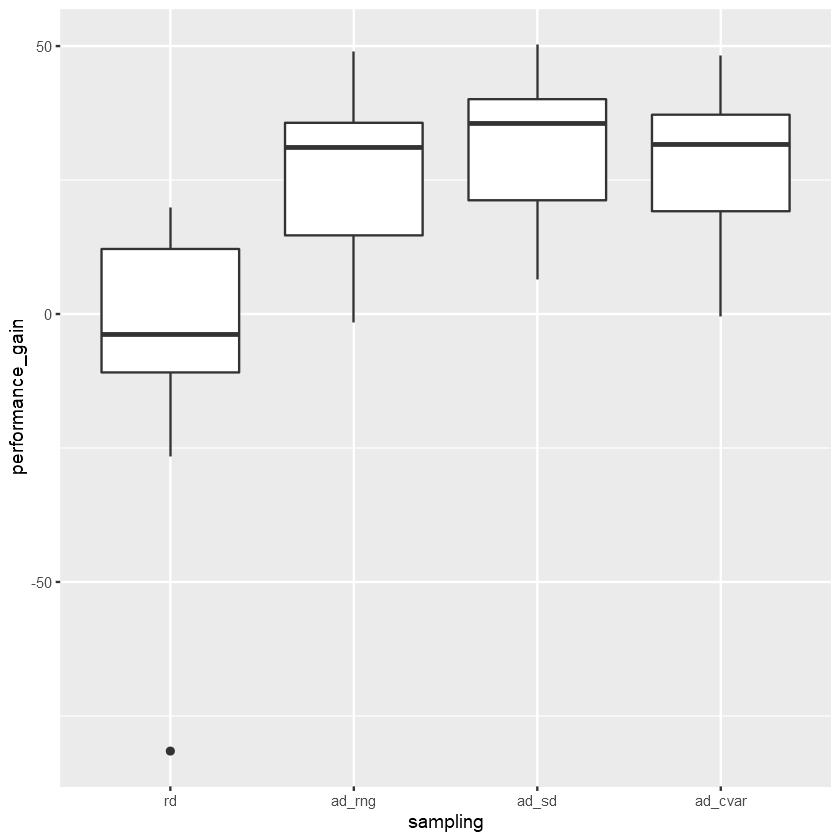

In [33]:
ggplot(data = refr_basic_Samplings_temp[seed != 1], aes(x = sampling, y = performance_gain)) +
        geom_boxplot() 

Yani, 
passive ve initial active setler arasındaki performans farkı yüksekse, ad yöntemlerininin de performans gain'i yüksek. Rd için de yüksek ama rd'nin performans gaini Ad'lere göre çok daha sınırlı. Yani, ilk data set kötü performans verse bile, adaptive sampling ile bununla baş edebiliriz.
performans gain eğer ps'yi outperfm ediyorsa +tir. Outperfom edemiyorsa negatif. Ad yöntemleri, özellikle ad_sd, aynı boyutaki training sette(100) %30'a yakın performans artışı sağlıyor.

**Comparison of Performances of Samplings**

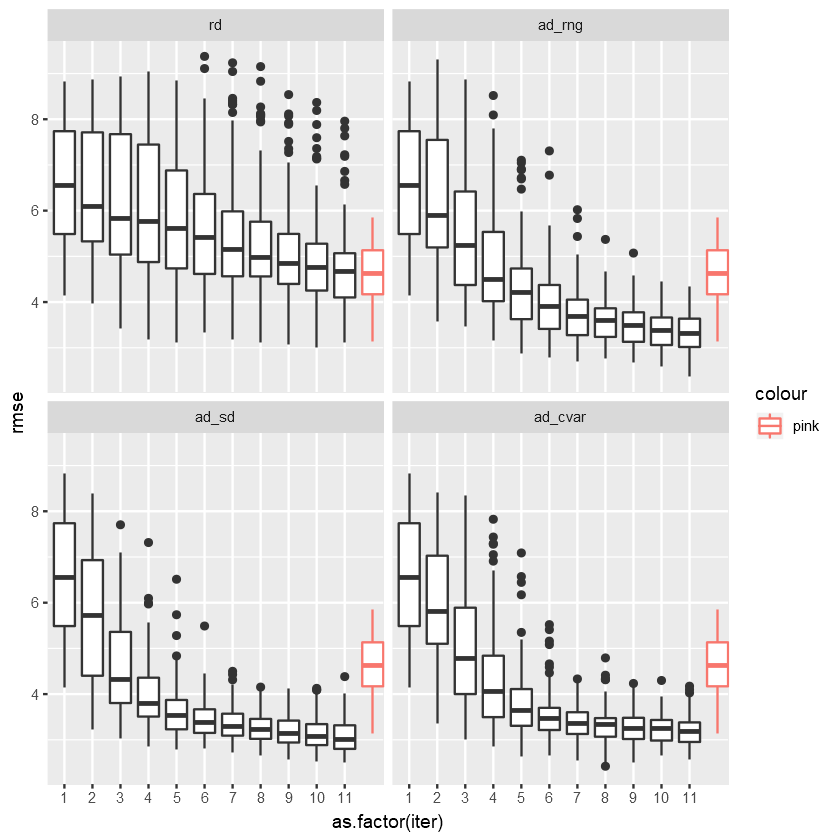

In [34]:
#rmse
ggplot(data = refr_basic[ sampling != "ps"], aes(x = as.factor(iter), y = rmse)) + 
            geom_boxplot() + 
            geom_boxplot(data = refr_basic[sampling == "ps",.(rmse)], aes(x = 12, y =rmse, col = "pink")) +
            facet_wrap(~sampling)

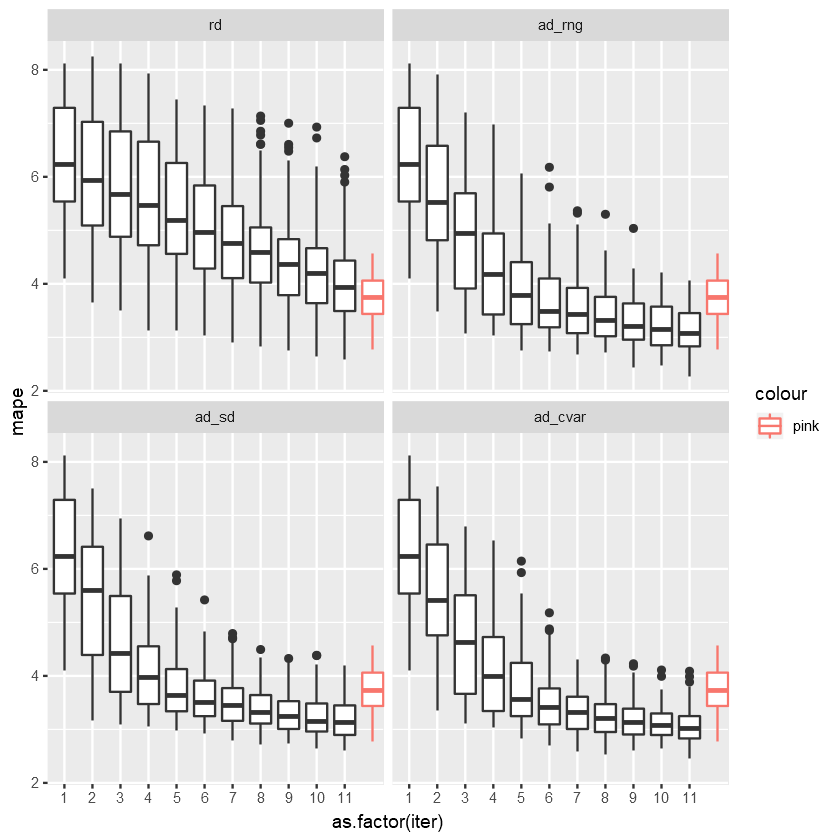

In [35]:
#mape
ggplot(data = refr_basic[ sampling != "ps"], aes(x = as.factor(iter), y = mape)) + 
            geom_boxplot() + 
            geom_boxplot(data = refr_basic[sampling == "ps",.(mape)], aes(x = 12, y =mape, col = "pink")) +
            facet_wrap(~sampling)

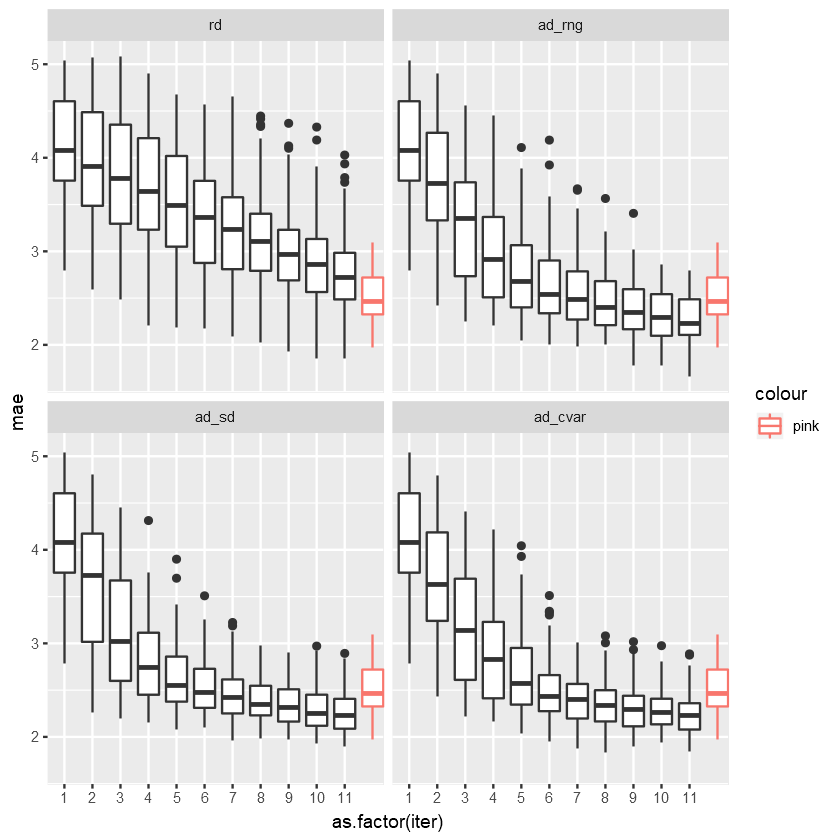

In [36]:
#mae
ggplot(data = refr_basic[testsize == 100 & sampling != "ps"], aes(x = as.factor(iter), y = mae)) + 
            geom_boxplot() + 
            geom_boxplot(data = refr_basic[testsize == 100 & sampling == "ps",.(mae)], aes(x = 12, y =mae, col = "pink")) +
            facet_wrap(~sampling)

### Segregation Model with Noise, mtyr = 2

**General performance**

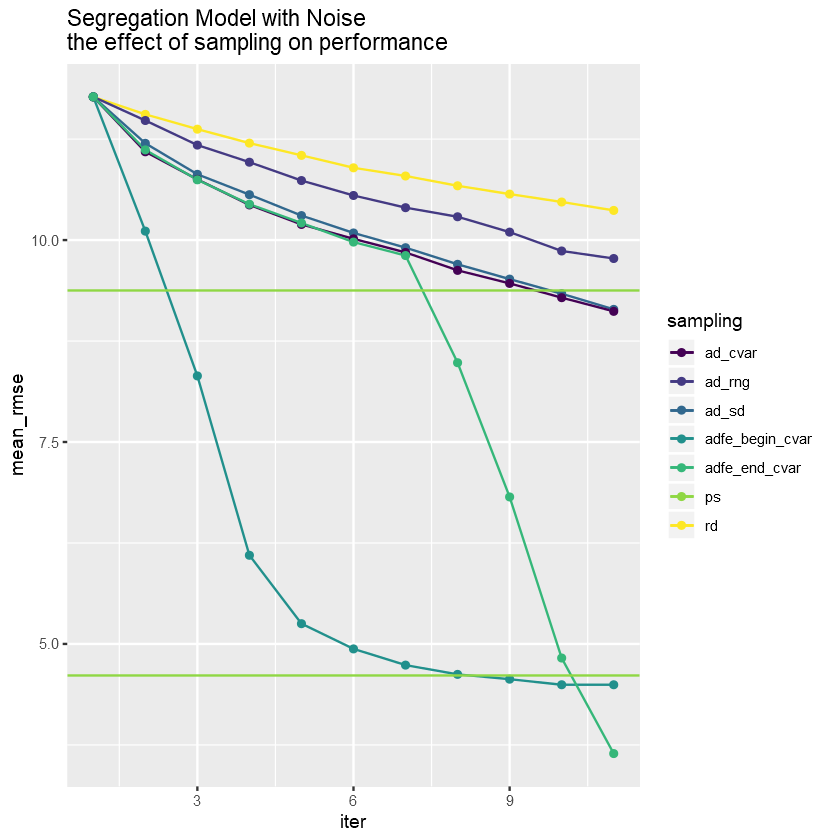

In [37]:
ggplot(data = refr_dummy[sampling != "ps", .(mean_rmse = mean(rmse)), .(iter, sampling)], 
          aes(x = iter, y = mean_rmse, col = sampling, group = sampling)) + 
    geom_line() + 
    geom_point() + 
    geom_hline(data = refr_dummy[sampling == "ps", .(mean_rmse = mean(rmse)),.(iter, sampling)],
                aes(yintercept = mean_rmse, col = sampling)) + 
    geom_hline(data = refr_basic[sampling == "ps", .(mean_rmse = mean(rmse)),.(iter, sampling)],
                aes(yintercept = mean_rmse, col = sampling)) + 
    ggtitle(paste0("Segregation Model with Noise", "\n", "the effect of sampling on performance "))

**Effect of seeds on general performance**

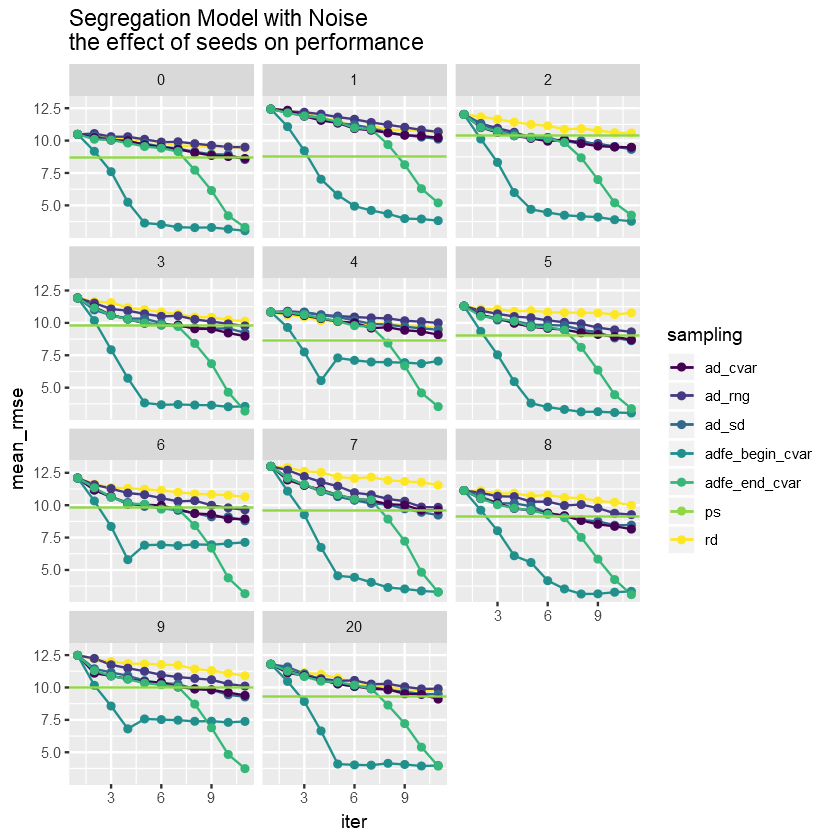

In [38]:
ggplot(data = refr_dummy[sampling != "ps", .(mean_rmse = mean(rmse)),.(iter,sampling,seed)]
       , aes(x = iter, y = mean_rmse, col = sampling, group = sampling)) + 
    geom_line() + 
    geom_point() +
    geom_hline(data = refr_dummy[sampling == "ps", .(mean_rmse = mean(rmse)),.(iter,sampling,seed)],
                  aes(yintercept = mean_rmse, col = sampling)) +
    facet_wrap(~seed, ncol = 3) +
    ggtitle(paste0("Segregation Model with Noise", "\n", "the effect of seeds on performance "))

**Marginal Effect of Seeds on the general performance**

In [39]:
refr_dummy_margin = data.table()
all.seed = c(0:9,20)
for(i in all.seed){
seed.focus = setdiff(all.seed,i)     
   refr_dummy_margin =  rbind(refr_dummy_margin
                            , data.table(
                      refr_dummy[seed %in% seed.focus, .(mean_rmse = mean(rmse)),.(iter,sampling)] %>% 
                         dcast(iter~sampling, value.var = "mean_rmse") ,
                      seed_without = i)
          )
}
refr_dummy_margin[, ps := na.locf(ps, na.rm = TRUE)]
refr_dummy_margin = melt(refr_dummy_margin, id.vars = c("seed_without","iter"))#, measure.vars = c("ps","rd","ad_rng","ad_sd","ad_cvar"))
setnames(refr_dummy_margin, c("variable","value"),c("sampling","mean_rmse"))
refr_dummy_margin$sampling <- factor(refr_dummy_margin$sampling, levels = c('ps','rd','ad_rng','ad_sd','ad_cvar','adfe_begin_cvar','adfe_end_cvar'), ordered = T)

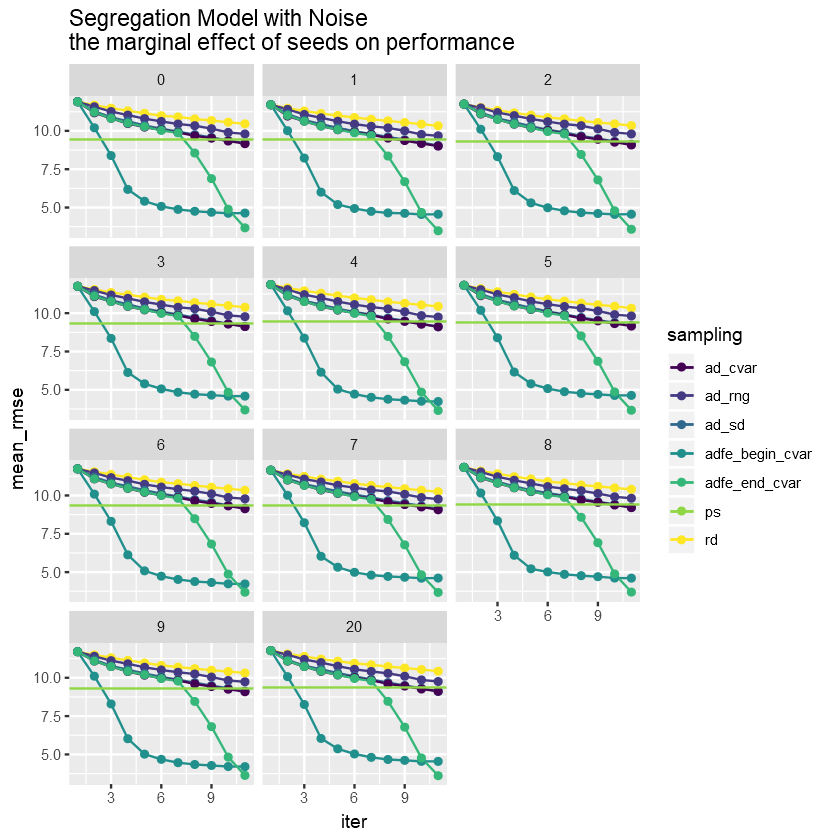

In [40]:
ggplot(data = refr_dummy_margin[ sampling != "ps"]
       , aes(x = iter, y = mean_rmse, col = sampling, group = sampling)) + geom_line() + geom_point() +
        geom_hline(data = refr_dummy_margin[sampling == "ps"],
                  aes(yintercept = mean_rmse, col = sampling)) +
    facet_wrap(~seed_without, ncol = 3)+ 
    ggtitle(paste0("Segregation Model with Noise", "\n", "the marginal effect of seeds on performance "))

**When ps is outperformed**

*when the samplings outperferm the passive sampling*

In [41]:
refr_dummy_Samplings =  refr_dummy[, .(mean_rmse = mean(rmse)),.(iter,sampling,seed)] %>% 
                         dcast(seed + iter~sampling, value.var = "mean_rmse") %>% 
                        setcolorder(c("seed","iter","ps","rd","ad_rng","ad_sd","ad_cvar",'adfe_begin_cvar','adfe_end_cvar'))
refr_dummy_Samplings[, ps := na.locf(ps, na.rm = TRUE)]
refr_dummy_Samplings[,':='(rd_pass=ifelse(rd>ps, NA,iter), 
                           ad_rng_pass=ifelse(ad_rng>ps, NA,iter),
                           ad_sd_pass=ifelse(ad_sd>ps, NA,iter),
                           ad_cvar_pass=ifelse(ad_cvar>ps, NA,iter),
                           adfe_begin_cvar_pass=ifelse(adfe_begin_cvar>ps, NA,iter),
                           adfe_end_cvar_pass=ifelse(adfe_end_cvar>ps, NA,iter)                                                    
                          )]
refr_dummy_Samplings[,':='(rd_pass = na.locf(rd_pass, na.rm = TRUE,fromLast = TRUE),
                           ad_rng_pass = na.locf(ad_rng_pass, na.rm = TRUE,fromLast = TRUE),
                           ad_sd_pass = na.locf(ad_sd_pass, na.rm = TRUE,fromLast = TRUE),
                           ad_cvar_pass = na.locf(ad_cvar_pass, na.rm = TRUE,fromLast = TRUE),
                           adfe_begin_cvar_pass = na.locf(adfe_begin_cvar_pass, na.rm = TRUE,fromLast = TRUE),
                           adfe_end_cvar_pass = na.locf(adfe_end_cvar_pass, na.rm = TRUE,fromLast = TRUE)
                          ) ,.(seed)]

refr_dummy_Samplings[is.na(refr_dummy_Samplings)] <- 100 # replace NA

In [42]:
refr_dummy_Samplings[iter == 1,.(seed,passive = ps,active = rd,diff_active_pas = round(rd - ps,2),rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass,adfe_begin_cvar_pass,adfe_end_cvar_pass)]

print(paste0("standard deviation of initial passive peformance:", 
    sd(refr_dummy_Samplings[iter == 1,.(seed,passive = ps,active = rd,rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass)]$passive) %>% round(2)))
print(paste0("standard deviation of initial active peformance:", 
    sd(refr_dummy_Samplings[iter == 1,.(seed,passive = ps,active = rd,rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass)]$active) %>% round(2)))

seed,passive,active,diff_active_pas,rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass,adfe_begin_cvar_pass,adfe_end_cvar_pass
<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>
0,8.734349,10.48417,1.75,100,100,11,11,3,8
1,8.758201,12.43409,3.68,100,100,100,100,4,9
2,10.383637,12.02145,1.64,100,5,5,4,2,4
3,9.792640,11.92611,2.13,100,11,7,8,3,7
4,8.671397,10.84002,2.17,100,100,100,100,3,8
5,9.029330,11.29871,2.27,100,100,10,10,3,8
6,9.789148,12.09599,2.31,100,11,6,7,3,6
7,9.621258,13.00056,3.38,100,100,10,10,3,8
8,9.096177,11.13066,2.03,100,100,8,8,3,7


[1] "standard deviation of initial passive peformance:0.58"
[1] "standard deviation of initial active peformance:0.76"


In [43]:
median(refr_dummy_Samplings[iter == 1 & seed != 1]$rd_pass)
median(refr_dummy_Samplings[iter == 1 & seed != 1]$ad_rng_pass)
median(refr_dummy_Samplings[iter == 1 & seed != 1]$ad_sd_pass)
median(refr_dummy_Samplings[iter == 1 & seed != 1]$ad_cvar_pass)
median(refr_dummy_Samplings[iter == 1 & seed != 1]$adfe_begin_cvar_pass)
median(refr_dummy_Samplings[iter == 1 & seed != 1]$adfe_end_cvar_pass)

[1] 100

[1] 100

[1] 9

[1] 9

[1] 3

[1] 8

In [44]:
# eğer replikasyonları da hesaba katarsak;
refr_dummy_Samplings_rep =  refr_dummy[,.(iter,seed,rep,sampling,rmse)] %>% 
                         dcast(seed + rep + iter~sampling, value.var = "rmse") %>% 
                        setcolorder(c("seed","rep","iter","ps","rd","ad_rng","ad_sd","ad_cvar",'adfe_begin_cvar','adfe_end_cvar'))

refr_dummy_Samplings_rep[, ps := na.locf(ps, na.rm = TRUE)]
refr_dummy_Samplings_rep[,':='(rd_pass=ifelse(rd>ps, NA,iter), 
                           ad_rng_pass=ifelse(ad_rng>ps, NA,iter),
                           ad_sd_pass=ifelse(ad_sd>ps, NA,iter),
                           ad_cvar_pass=ifelse(ad_cvar>ps, NA,iter),
                           adfe_begin_cvar_pass=ifelse(adfe_begin_cvar>ps, NA,iter),
                           adfe_end_cvar_pass=ifelse(adfe_end_cvar>ps, NA,iter)                                                    
                          )]
refr_dummy_Samplings_rep[,':='(rd_pass = na.locf(rd_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_rng_pass = na.locf(ad_rng_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_sd_pass = na.locf(ad_sd_pass, na.rm = FALSE,fromLast = TRUE),
                           ad_cvar_pass = na.locf(ad_cvar_pass, na.rm = FALSE,fromLast = TRUE),
                           adfe_begin_cvar_pass = na.locf(adfe_begin_cvar_pass, na.rm = FALSE,fromLast = TRUE),
                           adfe_end_cvar_pass = na.locf(adfe_end_cvar_pass, na.rm = FALSE,fromLast = TRUE)
                          ) ,.(seed,rep)]

refr_dummy_Samplings_rep[is.na(refr_dummy_Samplings_rep)] <- 100 # replace NA

In [45]:
median(refr_dummy_Samplings_rep[iter == 1 & seed != 1]$rd_pass)
median(refr_dummy_Samplings_rep[iter == 1 & seed != 1]$ad_rng_pass)
median(refr_dummy_Samplings_rep[iter == 1 & seed != 1]$ad_sd_pass)
median(refr_dummy_Samplings_rep[iter == 1 & seed != 1]$ad_cvar_pass)
median(refr_dummy_Samplings_rep[iter == 1 & seed != 1]$adfe_begin_cvar_pass)
median(refr_dummy_Samplings_rep[iter == 1 & seed != 1]$adfe_end_cvar_pass)

[1] 100

[1] 100

[1] 8

[1] 8

[1] 3

[1] 8

**How much ps is outperformed**

In [46]:
# how much the samplings outperform the passive sampling
refr_dummy_Samplings_temp = refr_dummy_Samplings[iter %in% c(1,11),.(seed,iter,ps,rd,ad_rng,ad_sd,ad_cvar,adfe_begin_cvar,adfe_end_cvar)] %>% 
                                   melt(id.vars = c("seed","iter","ps"), measure.vars = c("rd","ad_rng","ad_sd","ad_cvar","adfe_begin_cvar","adfe_end_cvar")) %>%
                                   dcast(seed + variable + ps ~iter,value.var = "value")
setnames(refr_dummy_Samplings_temp,c("variable","1","11"),c("sampling","initial","final"))
refr_dummy_Samplings_temp[,':=' (diff_ps_initial = round(initial-ps,2),
                                 diff_initial_final = round(initial-final,2),
                                 performance_gain = ((ps-final)/ps)*100,
                                 outperform_ps = ifelse(final < ps,"1","0"))
                         ]

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


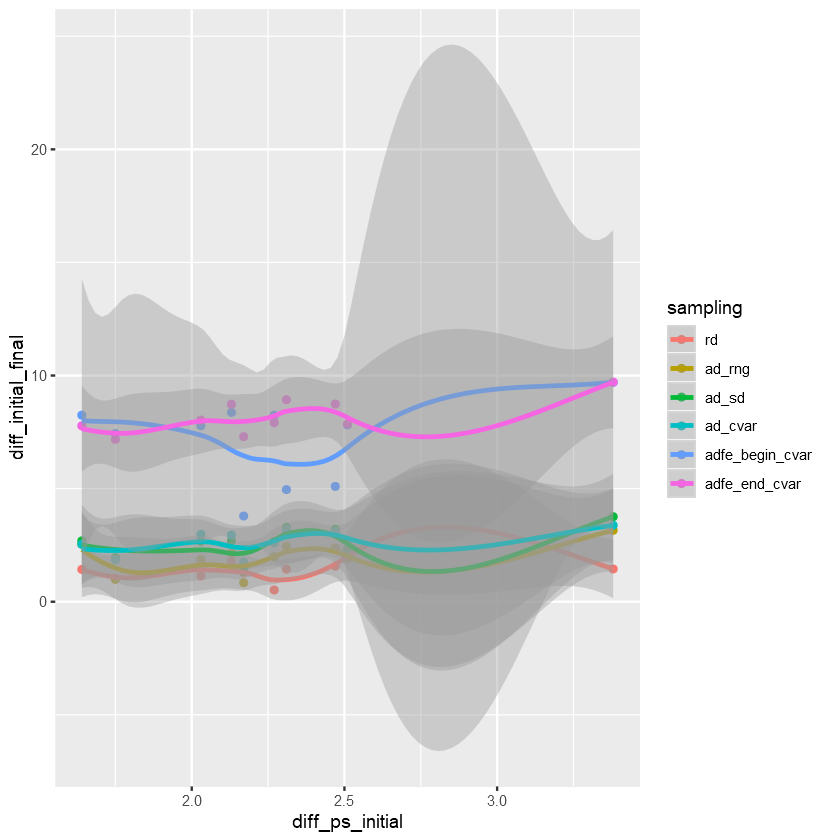

In [47]:
ggplot(data = refr_dummy_Samplings_temp[seed != 1], aes(x = diff_ps_initial, y = diff_initial_final, col = sampling, group = sampling)) +
        geom_point() + geom_smooth()

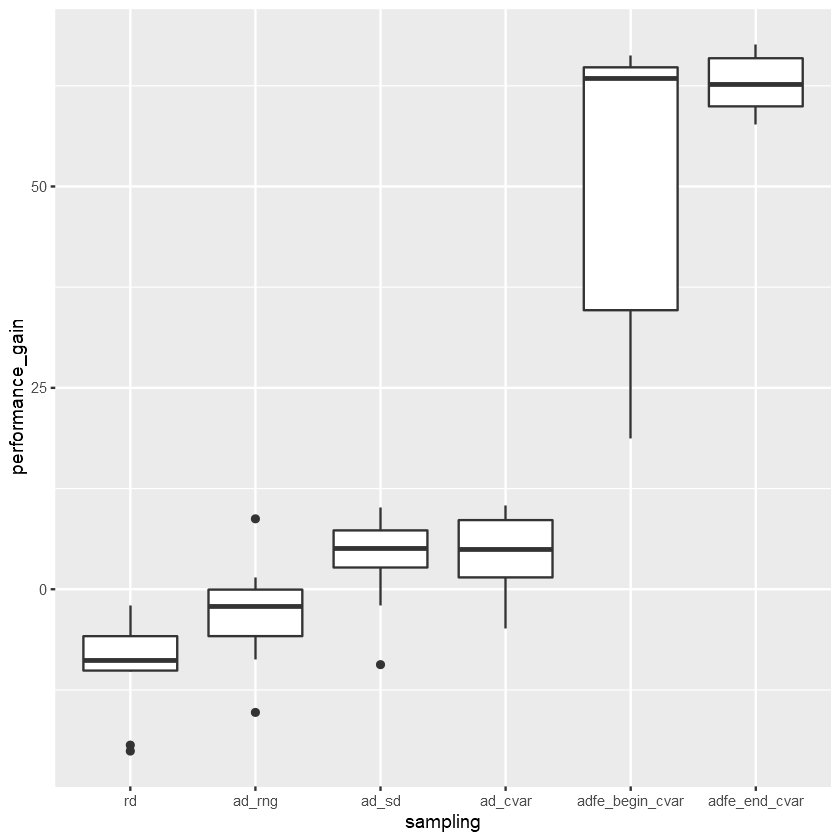

In [48]:
ggplot(data = refr_dummy_Samplings_temp[seed != 1], aes(x = sampling, y = performance_gain)) +
        geom_boxplot() 

**Comparison of Performances of Samplings**

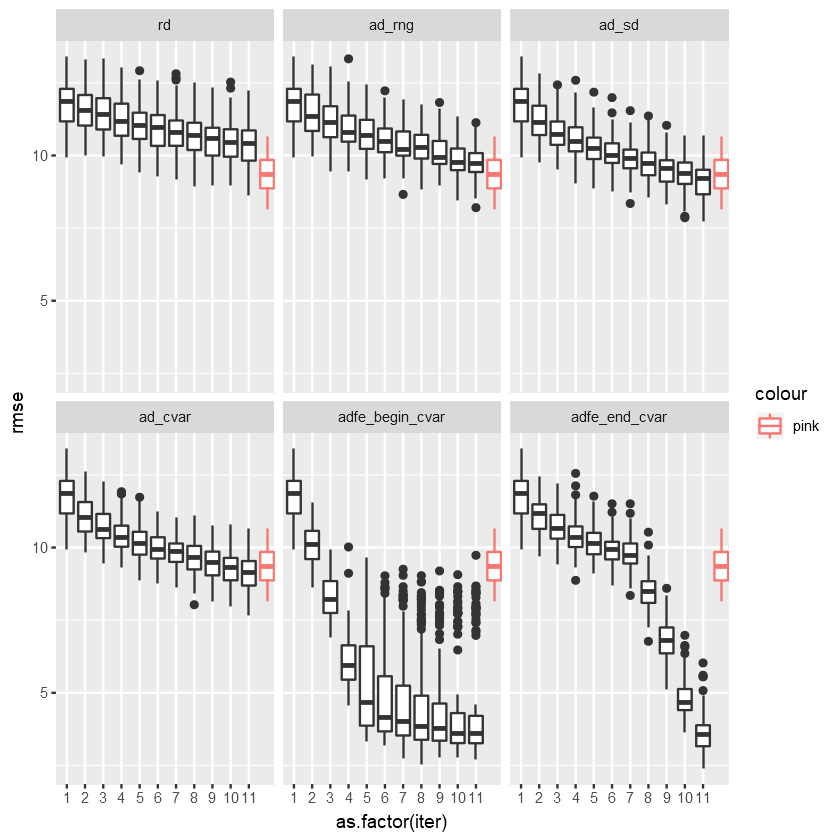

In [49]:
#rmse
ggplot(data = refr_dummy[ sampling != "ps"], aes(x = as.factor(iter), y = rmse)) + 
            geom_boxplot() + 
            geom_boxplot(data = refr_dummy[sampling == "ps",.(rmse)], aes(x = 12, y =rmse, col = "pink")) +
            facet_wrap(~sampling)

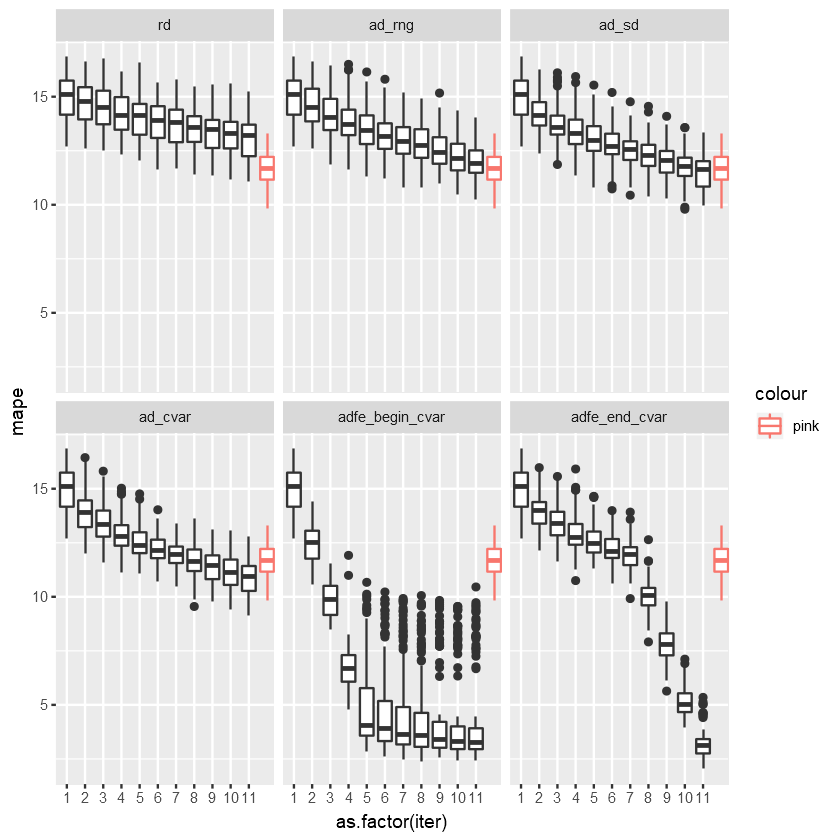

In [50]:
#mape
ggplot(data = refr_dummy[ sampling != "ps"], aes(x = as.factor(iter), y = mape)) + 
            geom_boxplot() + 
            geom_boxplot(data = refr_dummy[sampling == "ps",.(mape)], aes(x = 12, y =mape, col = "pink")) +
            facet_wrap(~sampling)

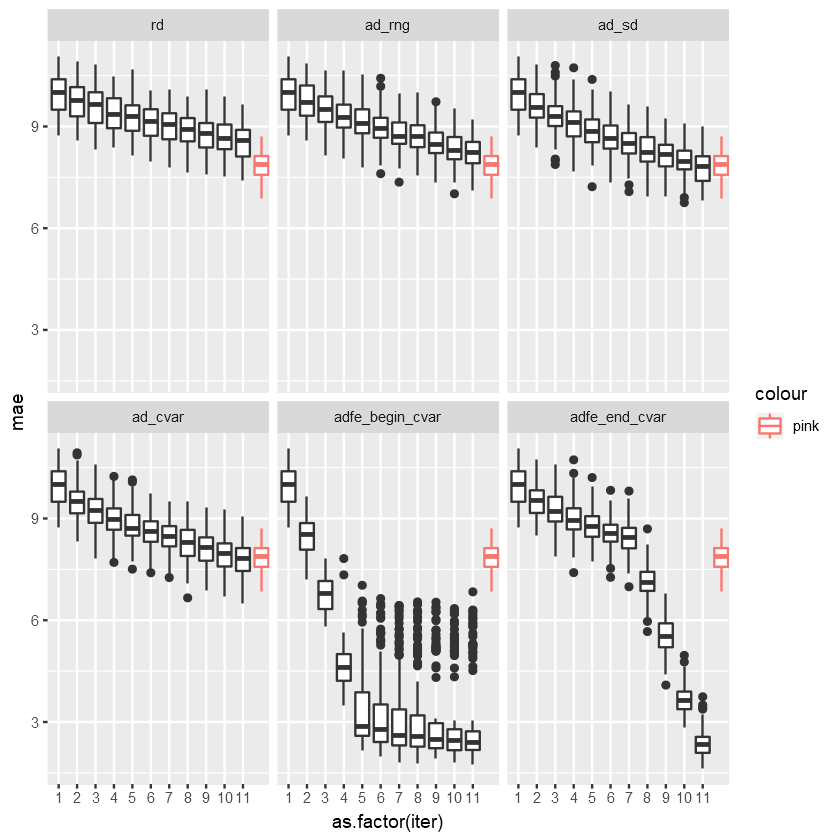

In [51]:
#mae
ggplot(data = refr_dummy[testsize == 100 & sampling != "ps"], aes(x = as.factor(iter), y = mae)) + 
            geom_boxplot() + 
            geom_boxplot(data = refr_dummy[sampling == "ps",.(mae)], aes(x = 12, y =mae, col = "pink")) +
            facet_wrap(~sampling)

## Effect of TestSize on Performance (refr)

Consider mtry = 2 and without seed 9, so in total 10 seeds

In [52]:
test_on_perf = perf_all[pool == "refr" & seed != 9 & !(sampling %in% c("adfe_begin_cvar","adfe_end_cvar")) & mtry == 2]

In [90]:
head(test_on_perf)

iter,seed,rep,mae,rmse,mape,model,pool,sampling,testsize,mtry
<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<ord>,<dbl>,<dbl>
1,0,1,2.698160,5.016994,4.019452,basic,refr,ps,100,2
1,0,1,2.546694,4.533208,3.477477,basic,refr,ps,200,2
1,0,1,2.725051,5.159832,4.099890,basic,refr,ps,300,2
1,0,1,2.430000,4.188233,3.432507,basic,refr,ps,400,2
1,0,2,2.668782,4.909340,3.973260,basic,refr,ps,100,2
1,0,2,2.559328,4.503512,3.491652,basic,refr,ps,200,2


In [91]:
test_on_perf_final = rbind(test_on_perf[sampling == "ps" & iter == 1]
                          ,test_on_perf[iter == 11])

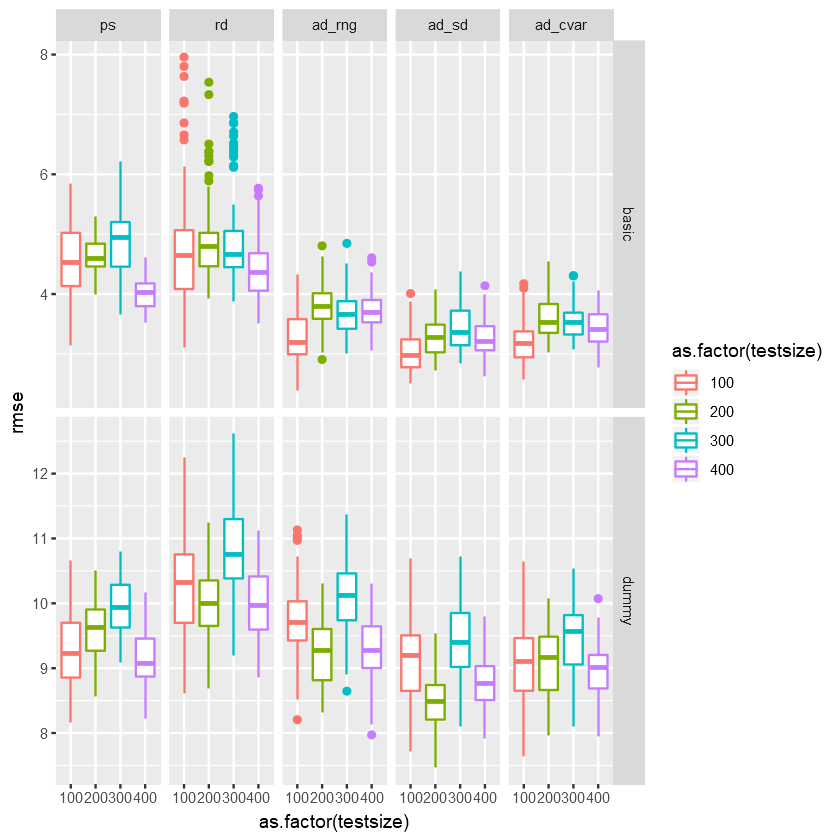

In [97]:
ggplot(data = test_on_perf_final, aes(x = as.factor(testsize), y = rmse, col = as.factor(testsize))) + geom_boxplot() + 
    facet_grid(model~sampling, scales = "free")

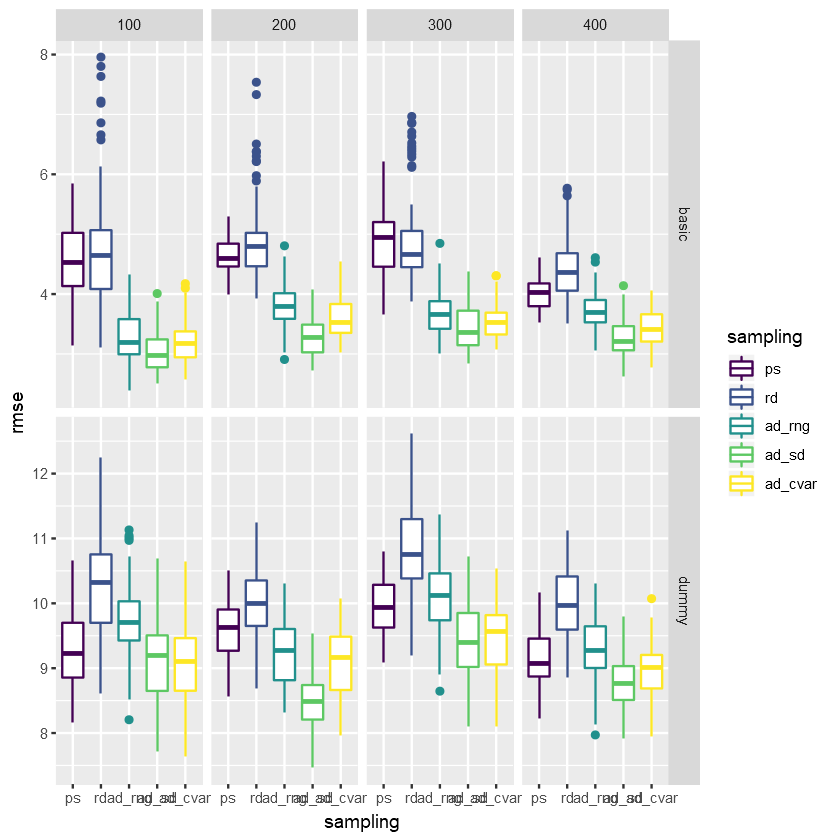

In [98]:
ggplot(data = test_on_perf_final, aes(x = sampling, y = rmse, col = sampling)) + geom_boxplot() + 
    facet_grid(model~testsize, scales = "free")

In [92]:
head(test_on_perf_final)

iter,seed,rep,mae,rmse,mape,model,pool,sampling,testsize,mtry
<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<ord>,<dbl>,<dbl>
1,0,1,2.698160,5.016994,4.019452,basic,refr,ps,100,2
1,0,1,2.546694,4.533208,3.477477,basic,refr,ps,200,2
1,0,1,2.725051,5.159832,4.099890,basic,refr,ps,300,2
1,0,1,2.430000,4.188233,3.432507,basic,refr,ps,400,2
1,0,2,2.668782,4.909340,3.973260,basic,refr,ps,100,2
1,0,2,2.559328,4.503512,3.491652,basic,refr,ps,200,2


### Segregation Model

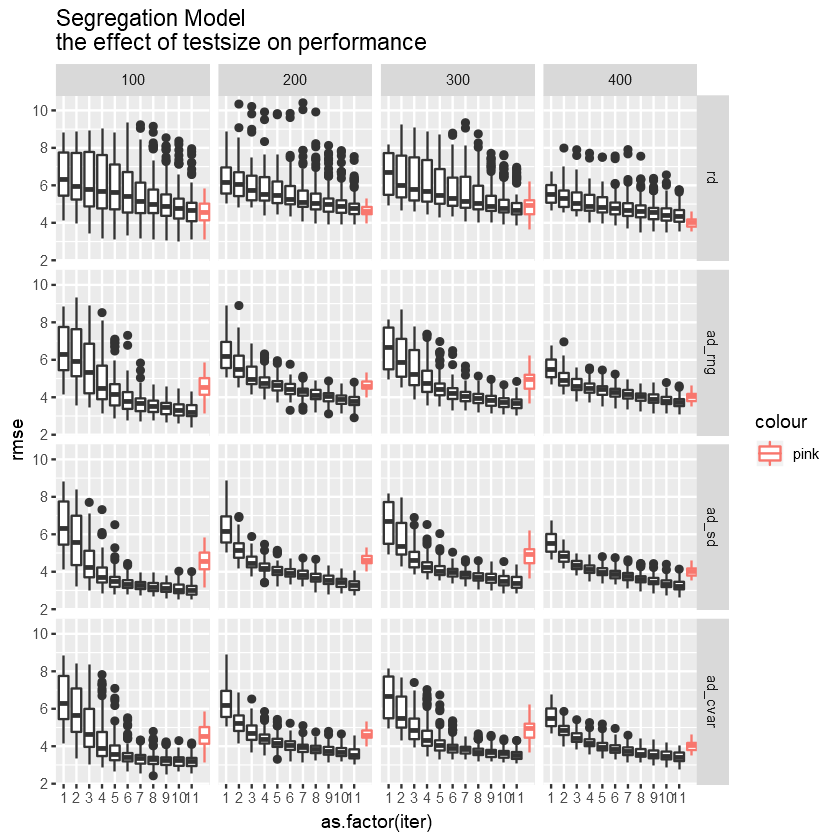

In [53]:
ggplot(data = test_on_perf[model == "basic" & sampling != "ps"],aes(x = as.factor(iter), y = rmse)) +
            geom_boxplot() +
            geom_boxplot(data = test_on_perf[model == "basic" & sampling == "ps", .(iter = "12",rmse,testsize)], aes(x = 12, y =rmse, col = "pink")) +
            facet_grid(sampling~testsize) +
            ggtitle(paste0("Segregation Model","\n","the effect of testsize on performance "))

### Segregation Model with Noise

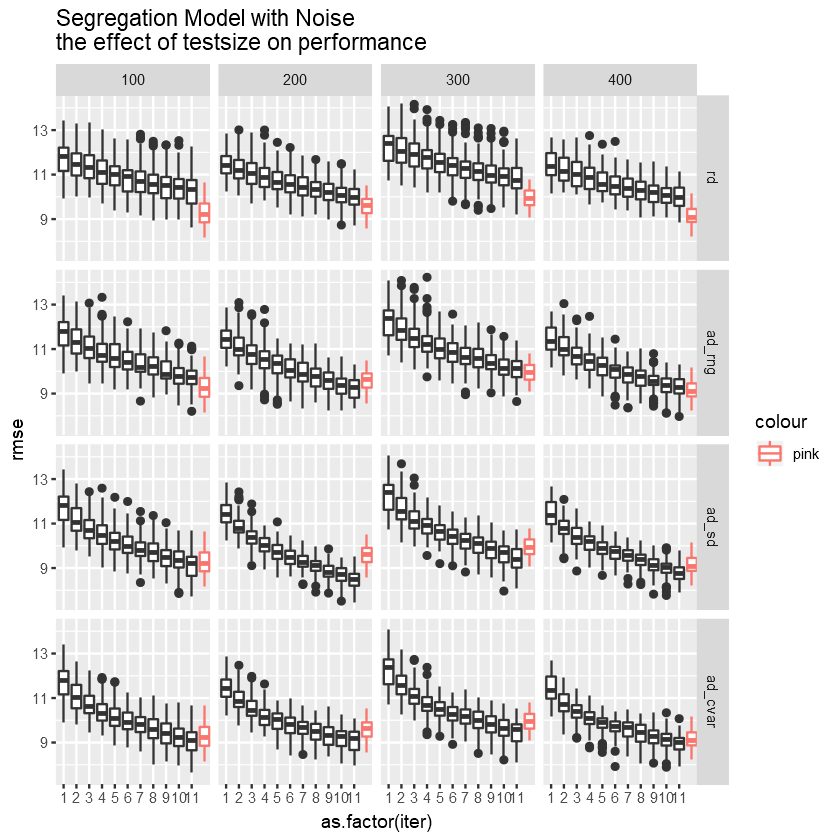

In [54]:
ggplot(data = test_on_perf[model == "dummy" & sampling != "ps"],aes(x = as.factor(iter), y = rmse)) +
            geom_boxplot() +
            geom_boxplot(data = test_on_perf[model == "dummy" & sampling == "ps", .(iter = "12",rmse,testsize)], aes(x = 12, y =rmse, col = "pink")) +
            facet_grid(sampling~testsize) +
            ggtitle(paste0("Segregation Model with Noise","\n","the effect of testsize on performance "))



## Effect of mtry on Performance (refr)

In [55]:
refr_dummy_mtry = perf_all[pool == "refr" & model == "dummy" & seed != 9  & testsize == 100 ]
# consider 10 seeds to be able to evaluate mtry 6 too, and then mtry 3 and 4 maybe

In [56]:
refr_dummy_mtry = refr_dummy_mtry[,.(iter, seed, rep, mae,rmse,mape, sampling_com = paste0(sampling,"_",mtry),mtry,sampling)]

In [57]:
refr_dummy_mtry

iter,seed,rep,mae,rmse,mape,sampling_com,mtry,sampling
<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<ord>
1,0,1,7.714170,8.777250,11.28354,ps_2,2,ps
1,0,2,7.235760,8.416973,10.69271,ps_2,2,ps
1,0,3,7.518851,8.647601,11.10332,ps_2,2,ps
1,0,4,7.665675,8.845131,11.30278,ps_2,2,ps
1,0,5,7.837043,9.104154,11.65727,ps_2,2,ps
1,0,6,7.619392,8.810264,11.29588,ps_2,2,ps
1,0,7,7.400008,8.527121,10.90372,ps_2,2,ps
1,0,8,7.815883,9.050109,11.49448,ps_2,2,ps
1,0,9,7.393281,8.511075,10.89043,ps_2,2,ps


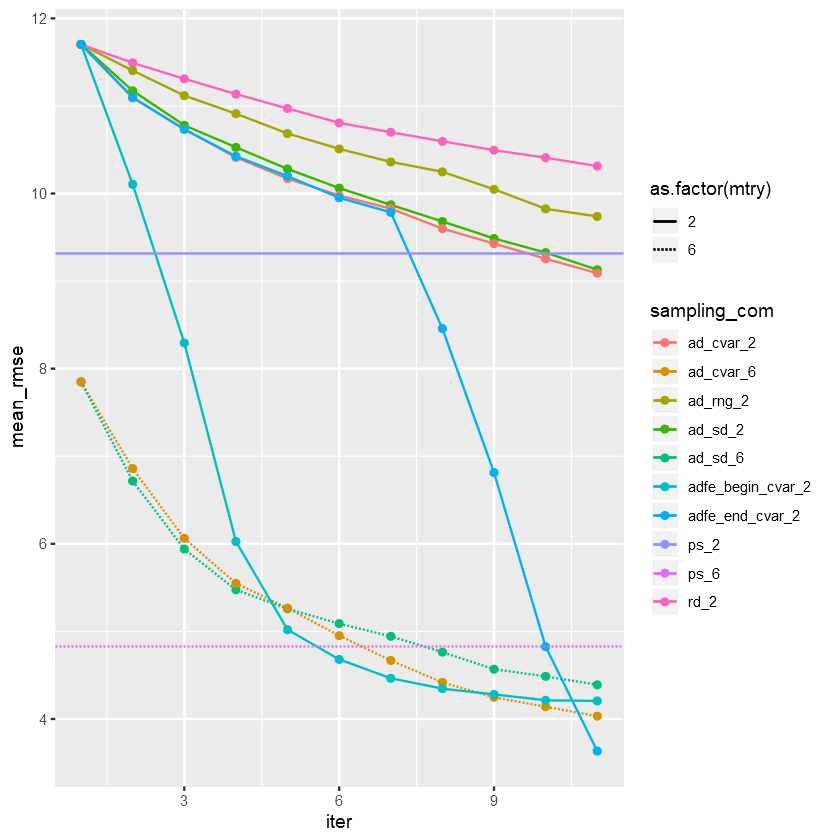

In [58]:
ggplot(data = refr_dummy_mtry[mtry %in% c(2,6) & sampling != c("ps"),.(mean_rmse = mean(rmse)),.(mtry,sampling_com,iter)]
            , aes(x = iter, y = mean_rmse, col = sampling_com, group = sampling_com, linetype= as.factor(mtry)) ) + 
    geom_line() +
    geom_point() + 
    geom_hline(data = refr_dummy_mtry[mtry %in% c(2,6) & sampling %in% c("ps"),.(mean_rmse = mean(rmse)),.(mtry,sampling_com,iter)]
              ,aes(yintercept = mean_rmse, col = sampling_com, linetype= as.factor(mtry))) 


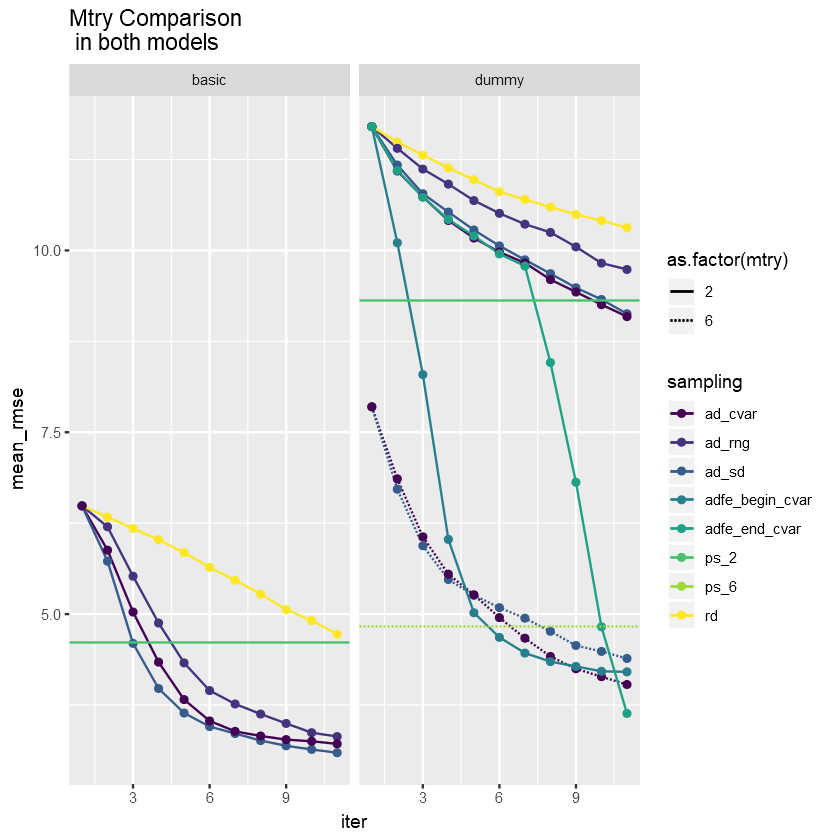

In [59]:
temp = refr_basic[,.(iter, seed, rep, mae,rmse,mape, sampling_com = paste0(sampling,"_",mtry),mtry,sampling,model)]
temp = rbind(temp[, .(mean_rmse = mean(rmse)), .(mtry,sampling_com,iter,model,sampling)],
            refr_dummy_mtry[mtry %in% c(2,6),.(mean_rmse = mean(rmse), model = "dummy"),.(mtry,sampling_com,iter,sampling)])

ggplot(data = temp[sampling != c("ps")]
            , aes(x = iter, y = mean_rmse, col = sampling, group = sampling_com, linetype= as.factor(mtry)) ) + 
    geom_line() +
    geom_point() + 
    facet_wrap(~model) + 
    geom_hline(data = temp[sampling %in% c("ps")]
              ,aes(yintercept = mean_rmse, col = sampling_com, linetype= as.factor(mtry))) + 
    ggtitle(paste0("Mtry Comparison", "\n", " in both models"))


## The Effect of Sampling on Performance (wrep)

In [60]:
perf_wrep= perf_all[pool == "wrep" & testsize == 100 & mtry == 2]
# can be different testsize and seeds ( if you campare test sizes then specfy seeds)

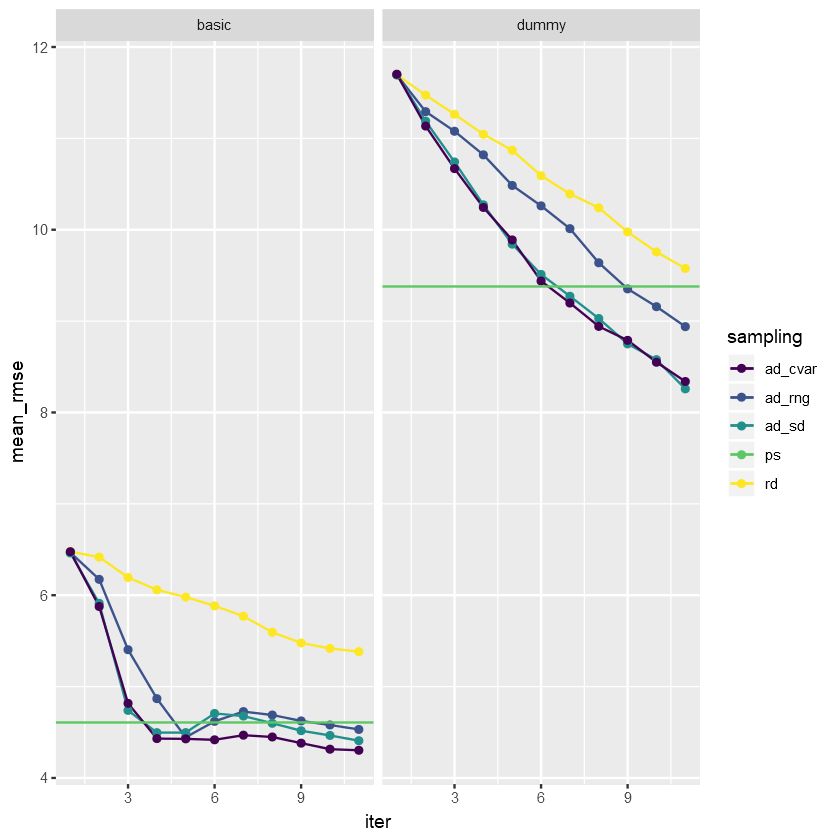

In [61]:
ggplot(data = perf_wrep[sampling != "ps",.(mean_rmse = mean(rmse)),.(sampling,model,iter)], aes(x = iter, y = mean_rmse, col =sampling, group = sampling)) +
    geom_line() +
    geom_point() +
    geom_hline(data = perf_wrep[sampling == "ps",.(mean_rmse = mean(rmse)),.(sampling,model)], aes(yintercept = mean_rmse, col =sampling, group = sampling)) +
    facet_wrap(~model)

basic için, ilk baştki ciddi düşüşler için train candidates'a bak. ilk 4 iterasyondakiler, informative'ler. yani 20 sample.
refr'daki performans değişimi nasıldı? 

ve de yine seed seed etkiler neleR?

In [62]:
perf_refr= perf_all[pool == "refr" & testsize == 100 & mtry == 2 & seed != 9]

# Train Candidates ( refr vs wrep )

# OOB Error

# Importance Values

names of importance tables : importance.wrep.all & importance.refr.all

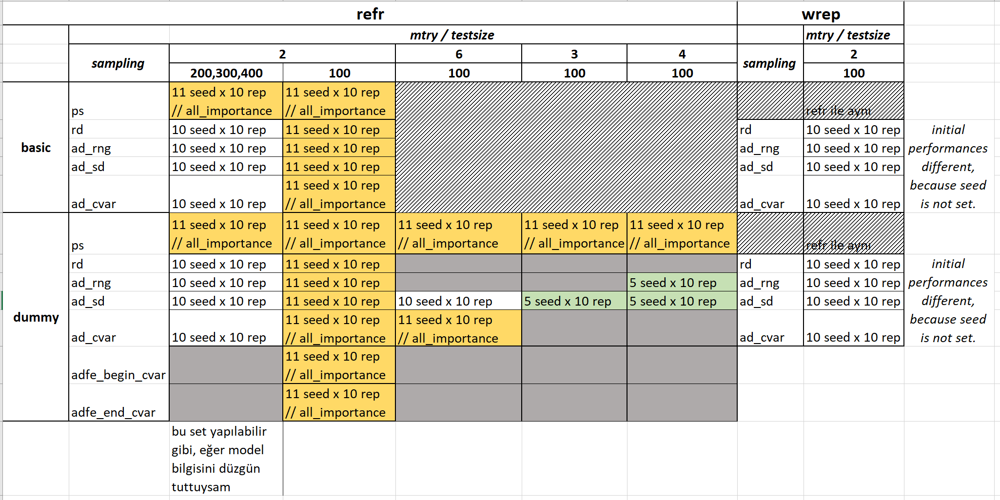

In [72]:
dt = importance.refr.all[seed == 4 & rep %in% c(1:5) & mtry == 2 & model == "dummy" & sampling == "ad_cvar" &pool == "refr" & scaled =="no" & type == 1]

In [73]:
head(dt)

seed,rep,iter_no,scaled,type,feature,value,mtry,model,pool,sampling
<int>,<int>,<int>,<chr>,<int>,<fct>,<dbl>,<dbl>,<chr>,<chr>,<chr>
4,1,1,no,1,density,4.725960,2,dummy,refr,ad_cvar
4,1,1,no,1,%-similar-wanted,19.404039,2,dummy,refr,ad_cvar
4,1,1,no,1,budget-multiplier-dummy,6.402392,2,dummy,refr,ad_cvar
4,1,1,no,1,density-multiplier-dummy,1.492430,2,dummy,refr,ad_cvar
4,1,1,no,1,noise-dummy,-1.418999,2,dummy,refr,ad_cvar
4,1,1,no,1,tick-limit,1.954617,2,dummy,refr,ad_cvar


In [76]:
dt_withoutrep = fread("C:/Users/paslanpatir/Desktop/TEZ_v2/outputs_withoutReplacement_4_Ad_coefvar_dummy_2020-03-30/dummy_importance_table_Ad_coefvar.csv")
dt_withoutrep = dt_withoutrep[scaled == "no" & type == 1]

In [81]:
dt = rbind(dt[,.(seed,rep,iter_no,feature,value,st = "withRep")], dt_withoutrep[,.(seed,rep,iter_no,feature,value,st = "withoutRep")])
head(dt)

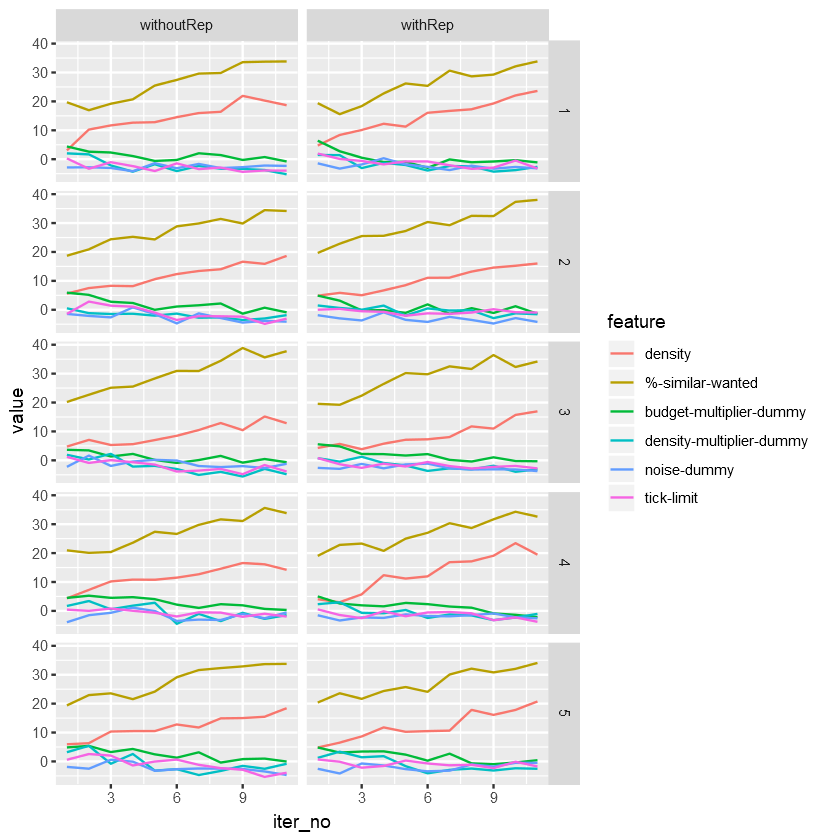

In [87]:
plot_seed4 = ggplot(data = dt, aes(x = iter_no, y = value, col = feature, group = feature )) + geom_line() + facet_grid(rep~st)
plot_seed4

In [ ]:
ggplotly(plot_seed4)

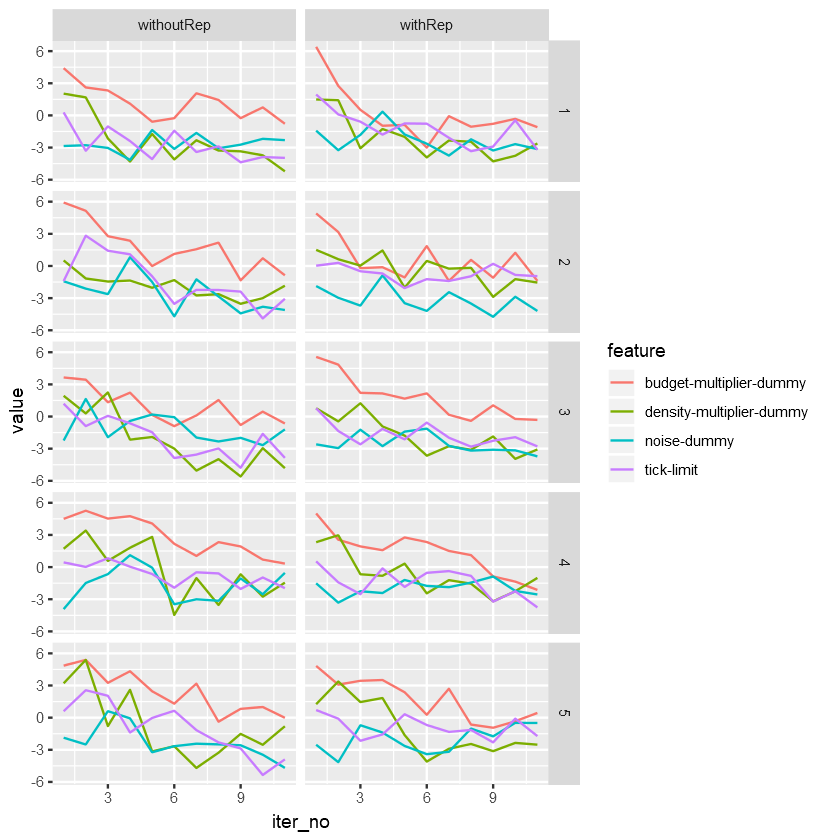

In [88]:
ggplot(data = dt[!(feature %in% c("density", "%-similar-wanted"))], aes(x = iter_no, y = value, col = feature, group = feature )) + geom_line() + facet_grid(rep~st)

# refr_dummy

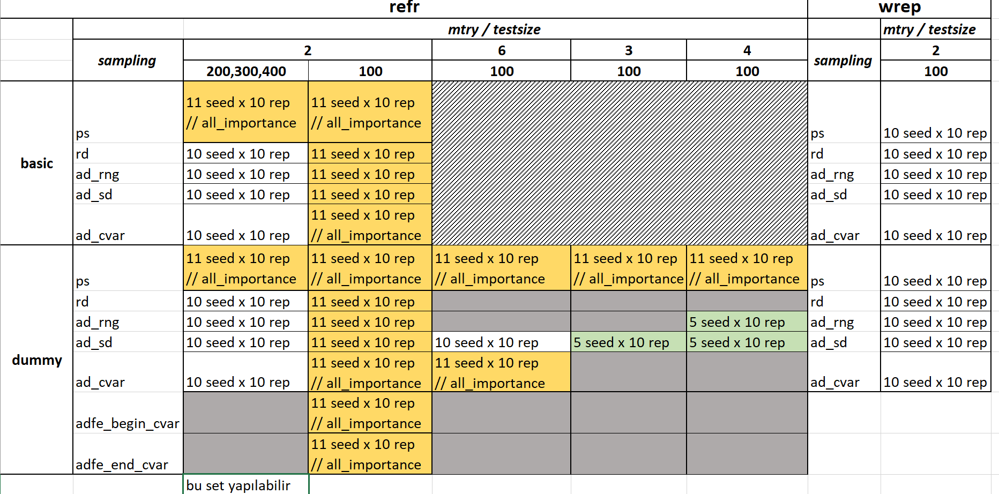

In [ ]:
refr_dummy= perf_all[]
# can be different testsize , mtry, and seeds ( if you campare test sizes then specfy seeds)

refr_dummy_Sampling = perf_all[ mtry == 2 & testsize == 100 ]



In [ ]:

### compare sampling performance

ggplot(data = refr_basic[testsize == 100 & sampling != "ps", .(mean_rmse = mean(rmse)),.(iter,sampling)]
       , aes(x = iter, y = mean_rmse, col = sampling, group = sampling)) + geom_line() + geom_point() +
        geom_hline(data = refr_basic[testsize == 100 & sampling == "ps", .(mean_rmse = mean(rmse)),.(iter,sampling)],
                  aes(yintercept = mean_rmse, col = sampling))

ggplot(data = refr_basic[testsize == 100 & sampling != "ps", .(mean_rmse = mean(rmse)),.(iter,sampling,seed)]
       , aes(x = iter, y = mean_rmse, col = sampling, group = sampling)) + geom_line() + geom_point() +
        geom_hline(data = refr_basic[testsize == 100 & sampling == "ps", .(mean_rmse = mean(rmse)),.(iter,sampling,seed)],
                  aes(yintercept = mean_rmse, col = sampling)) +
    facet_wrap(~seed, ncol = 3)

refr_basic_Samplings =  refr_basic[testsize == 100 , .(mean_rmse = mean(rmse)),.(iter,sampling,seed)] %>% 
                         dcast(seed + iter~sampling, value.var = "mean_rmse") %>% 
                        setcolorder(c("seed","iter","ps","rd","ad_rng","ad_sd","ad_cvar"))

refr_basic_Samplings[, ps := na.locf(ps, na.rm = TRUE)]
refr_basic_Samplings[,':='(rd_pass=ifelse(rd>ps, NA,iter), 
                           ad_rng_pass=ifelse(ad_rng>ps, NA,iter),
                           ad_sd_pass=ifelse(ad_sd>ps, NA,iter),
                           ad_cvar_pass=ifelse(ad_cvar>ps, NA,iter))]
refr_basic_Samplings[,':='(rd_pass = na.locf(rd_pass, na.rm = TRUE,fromLast = TRUE),
                           ad_rng_pass = na.locf(ad_rng_pass, na.rm = TRUE,fromLast = TRUE),
                           ad_sd_pass = na.locf(ad_sd_pass, na.rm = TRUE,fromLast = TRUE),
                           ad_cvar_pass = na.locf(ad_cvar_pass, na.rm = TRUE,fromLast = TRUE)) ,.(seed)]

refr_basic_Samplings[is.na(refr_basic_Samplings)] <- 100 # replace NA

# when the samplings outperferm the passive sampling
refr_basic_Samplings[iter == 1,.(seed,passive = ps,active = rd,diff_active_pas = round(rd - ps,2),rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass)]

print(paste0("standard deviation of initial passive peformance:", 
    sd(refr_basic_Samplings[iter == 1,.(seed,passive = ps,active = rd,rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass)]$passive) %>% round(2)))
print(paste0("standard deviation of initial active peformance:", 
    sd(refr_basic_Samplings[iter == 1,.(seed,passive = ps,active = rd,rd_pass,ad_rng_pass,ad_sd_pass,ad_cvar_pass)]$active) %>% round(2)))

median(refr_basic_Samplings[iter == 1 & seed != 1]$rd_pass)
median(refr_basic_Samplings[iter == 1& seed != 1]$ad_rng_pass)
median(refr_basic_Samplings[iter == 1 & seed != 1]$ad_sd_pass)
median(refr_basic_Samplings[iter == 1& seed != 1]$ad_cvar_pass)

# Other

In [ ]:
#fwrite(perf_all, "perf_all.csv")

In [ ]:
ggplot(data = sample_ad_rng[seed %in% c(0:3) ], aes(x = iter, y = rmse, col = rep , group = rep)) + geom_line() + geom_point() + facet_wrap(~seed, ncol = 2)

In [ ]:
ggplot(data = sample_ad_rng[seed %in% c(4:7) ], aes(x = iter, y = rmse, col = rep , group = rep)) + geom_line() + geom_point() + facet_wrap(~seed, ncol = 2)

In [ ]:
ggplot(data = sample_ad_rng[seed %in% c(8,9,20) ], aes(x = iter, y = rmse, col = rep , group = rep)) + geom_line() + geom_point() + facet_wrap(~seed, ncol = 2)

In [ ]:
head(perf_all)

In [ ]:
dummy_m2_100 = perf_all[mtry == 2 & testsize == 100 & model == "dummy"]

In [ ]:
a = ggplot(data =dummy_m2_100[seed %in% c(0:4), .(mean_rmse = mean(rmse)),.(iter,seed,pool,sampling)]
       , aes( x = iter, y= mean_rmse, col = sampling, group = sampling)) + geom_line() + facet_grid(seed~pool)
ggplotly(a)

In [ ]:
ggplotly(a)

In [ ]:
b = ggplot(data =dummy_m2_100[seed %in% c(0:4) & sampling %in% c("ad_cvar","ad_rng","ad_sd","rd"), .(mean_rmse = mean(rmse)),.(iter,seed,pool,sampling)]
       , aes( x = iter, y= mean_rmse, col = pool, group = pool)) + geom_line() + facet_grid(seed~sampling)
ggplotly(b)

In [ ]:
ggplotly(b)

head(dummy_m2_100)

In [63]:
head(perf_all[seed == 4 and rep %in% c(1:5) & model == "dummy" & pool =="refr"])

iter,seed,rep,mae,rmse,mape,model,pool,sampling,testsize,mtry
<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<ord>,<dbl>,<dbl>
1,0,1,2.698160,5.016994,4.019452,basic,wrep,ps,100,2
1,0,2,2.668782,4.909340,3.973260,basic,wrep,ps,100,2
1,0,3,2.705488,5.011937,4.030132,basic,wrep,ps,100,2
1,0,4,2.780665,5.118991,4.167613,basic,wrep,ps,100,2
1,0,5,2.754322,5.152491,4.117096,basic,wrep,ps,100,2
1,0,6,2.753141,5.038536,4.125870,basic,wrep,ps,100,2
